### пока просто вставим нужные модули и откроем файлы

In [1]:
import traja
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import seaborn as sns
from scipy import signal
import math

C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def returnStepsDFdeltaAng(df, dur):
    time_last = df['time'][0]
    ind_good = [0]
    for i in range(1, len(df)):
        if df['time'][i] - time_last >= dur:
            time_last = df['time'][i]
            ind_good.append(i)    
    df = df.iloc[ind_good]
    df = df.reset_index()
    df = df.drop(['index'], axis=1)
    #delAng = [0] * len(df) - лучше не делать так, а то мы не увидим ошибки типа нанов
    delAng = [0]
    for i in range(1,len(df)):
        d = df['angles'][i]-df['angles'][i-1]
        if d > 180:
            d = d - 360
        if d < -180:
            d = d + 360
        delAng.append(d)
    df['delta_angle'] = delAng
    return df

In [3]:
def openFile(ff):
    df = pd.read_csv(ff, sep=" ",header = None, names=['numb', 'time', 'x', 'y'])
    df = df.drop('numb', axis=1)
    df = df.drop(df[df.time > 1755].index)
    df.traja.plot()
    return(df)

def cutjump(df, xmax, xmin, ymax, ymin):
    dff = df[(df['x'] < xmax) & (df['x'] > xmin) & (df['y'] < ymax) & (df['y'] > ymin)]
    ind = range(0, len(dff))
    dff = dff.reindex(ind)
    dff.traja.plot()
    return dff

#мы добавляем фильтр скорость и НЕФИЛЬТРОВАННЫЕ углы
def addFilteredV(df):
    vx = []
    vy = []
    v = []
    ang = []
    boo = True
    for i in range(len(df)):
        if i == 0:
            vx.append(0)
            vy.append(0)
            v.append(0)
        else:
            dx = df['x'][i]-df['x'][i-1]
            dy = df['y'][i]-df['y'][i-1]
            dt = df['time'][i]-df['time'][i-1]
            vvx = dx/dt
            vvy = dy/dt
            vv = pow(pow(vvx, 2) + pow(vvy, 2), 0.5)
            vx.append(vvx)
            vy.append(vvy)
            v.append(vv)
            # угол
            #хз что делать с 0
            x = vvy/vvx
            if vvx >= 0:
                res = math.degrees(math.atan(x))
            else:
                res = 180 + math.degrees(math.atan(x))
            #убираем перевод в наглядную окружность. пусть остается тригонометрическая
            #if res <= 0:
                #res = -res + 90
                #вообще можно было бы записать и это как 360 - res + 90, т к лишние 360 и так вычитаются через пару строчек
            #elif res > 0:
                #res = 360 - res + 90
            if res >= 360:
                res -= 360
            ang.append(res)
            if boo:
                ang.append(res)
                boo = False
    df.insert(3, "Vx", vx)
    df.insert(4, "Vy", vy)
    df.insert(5, "V", v)
    df.insert(6, "angles", ang)
    #df['V'] = pd.Series(gaussian_filter1d(df['V'], 5))
    #df['Vx'] = pd.Series(gaussian_filter1d(df['Vx'], 5))
    #df['Vy'] = pd.Series(gaussian_filter1d(df['Vy'], 5))
    return(df)

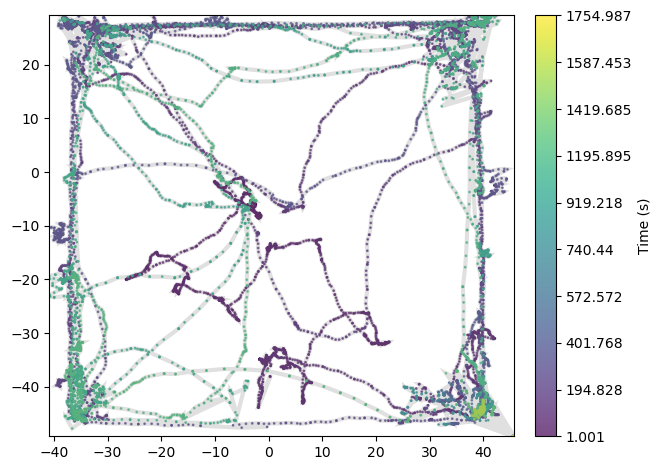

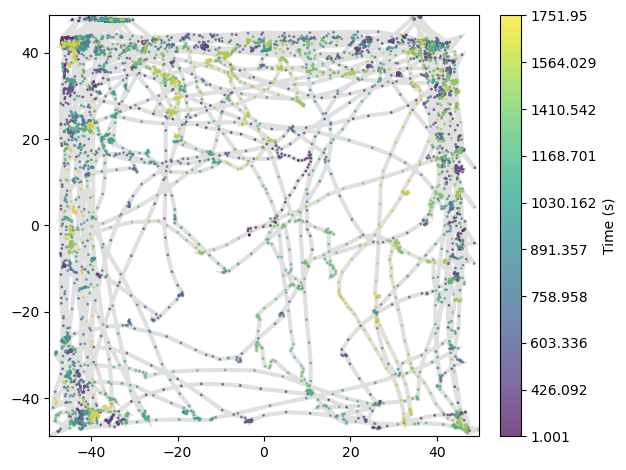

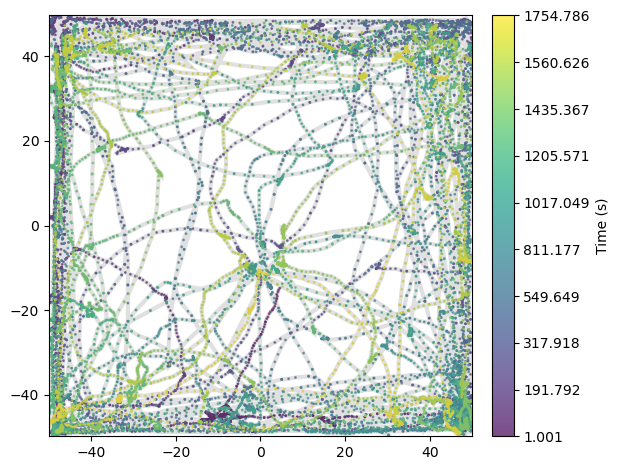

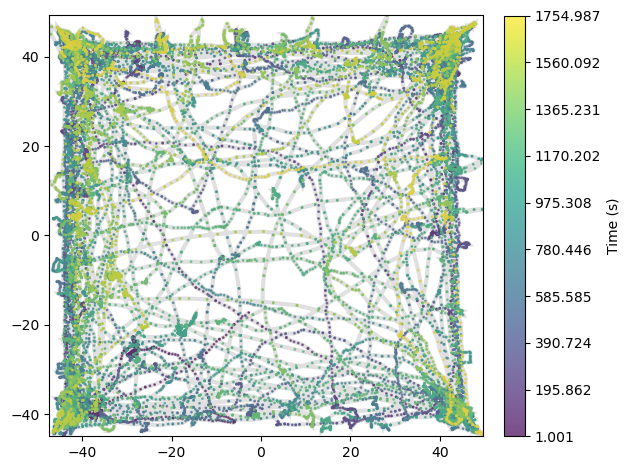

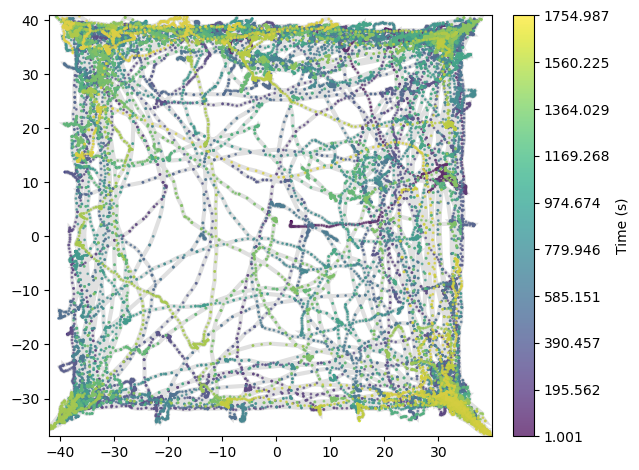

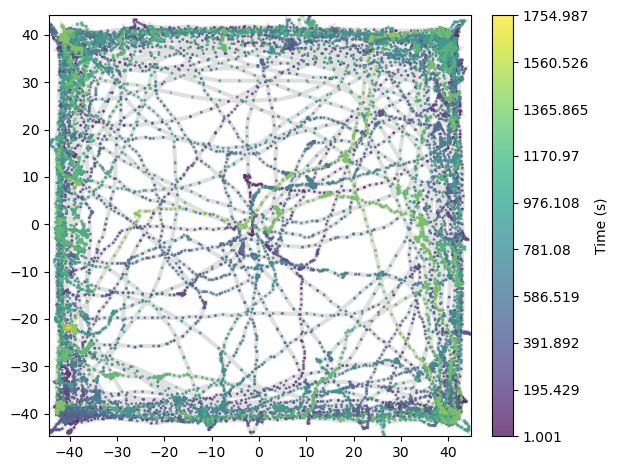

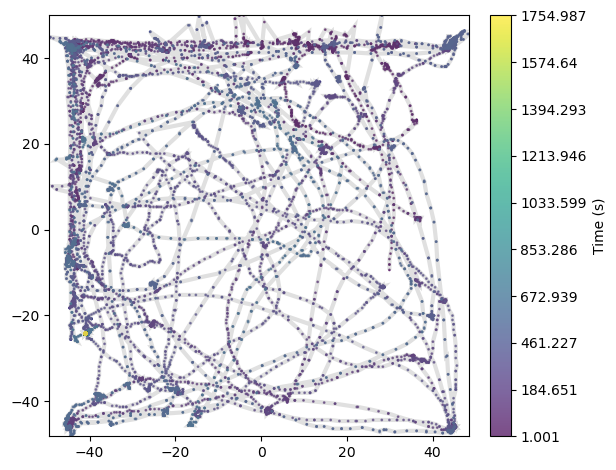

In [4]:
tr4 = openFile('Trace_4.txt')
tr3 = openFile('Trace_3.txt')
tr5 = openFile('Trace_5.txt')
tr6 = openFile('Trace_6.txt')
tr7 = openFile('Trace_7.txt')
tr91 = openFile('Trace_9.1.txt')
tr92 = openFile('Trace_9.2.txt')


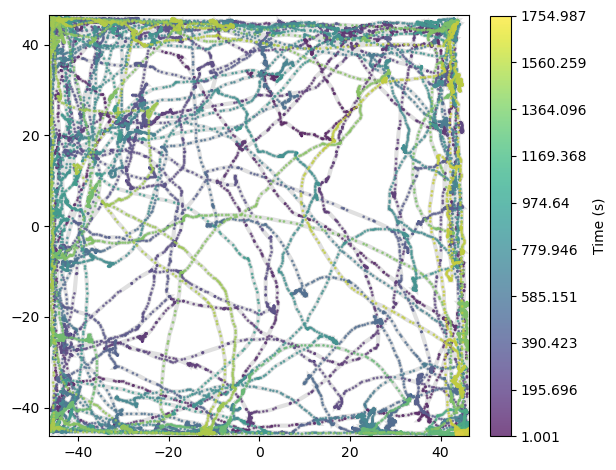

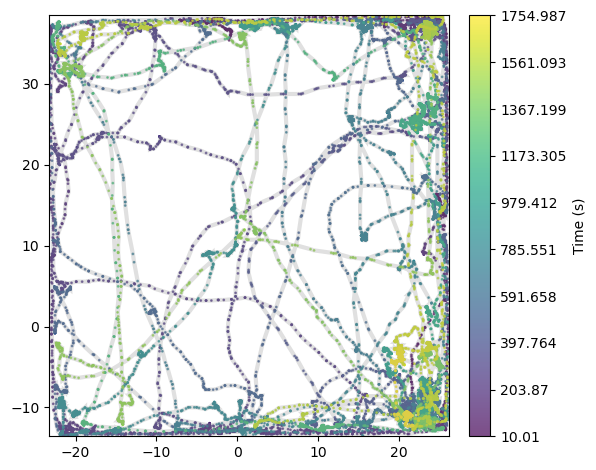

In [5]:
tr1, tr2 = openFile('Trace_1.1.txt'), openFile('Trace_2.txt')

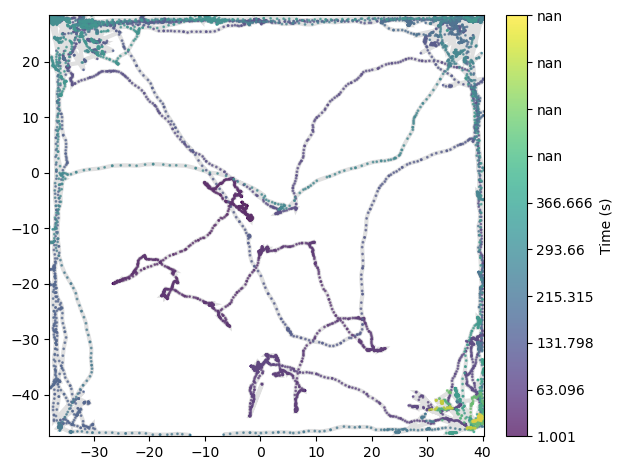

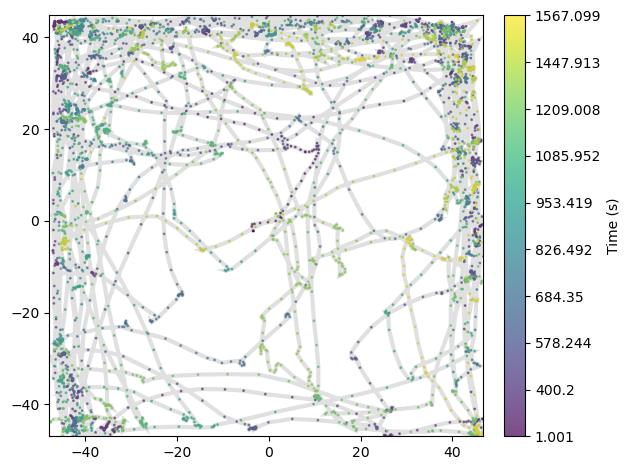

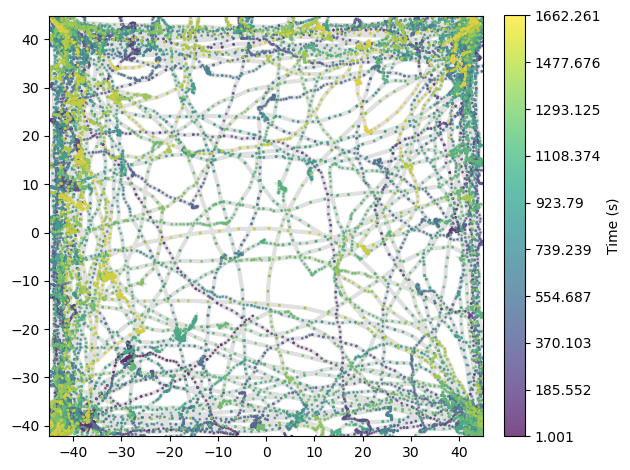

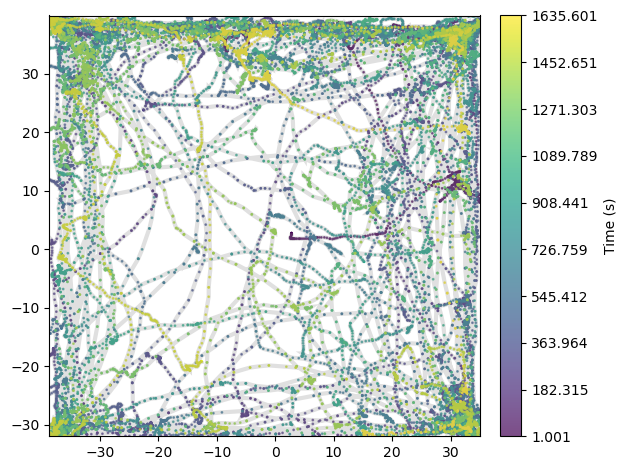

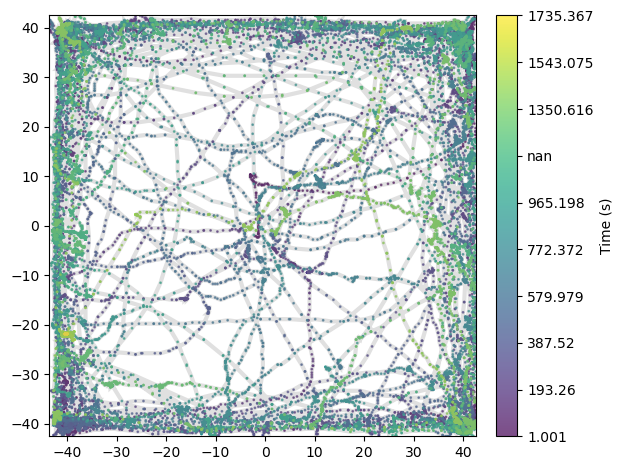

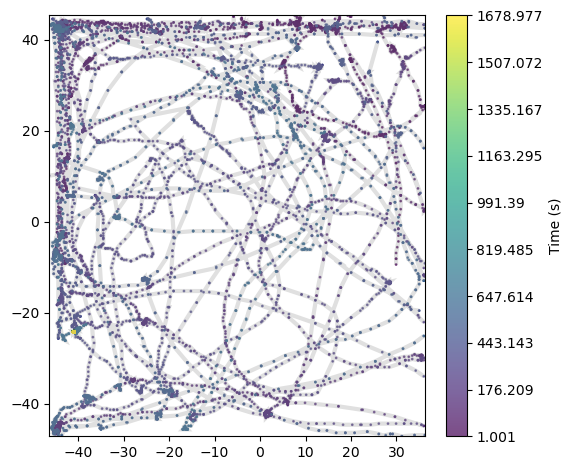

In [6]:
tr4 = cutjump(tr4, xmax=40.4, xmin=-38.1, ymax=28.3, ymin=-47.6)
tr3 = cutjump(tr3, xmax=46.8, xmin=-48, ymax=46, ymin=-47)
tr6 = cutjump(tr6, xmax=45, xmin=-45, ymax=45, ymin=-42.2)
tr7 = cutjump(tr7, xmax=35, xmin=-38.7, ymax=40, ymin=-32)
tr91 = cutjump(tr91, xmax=42.5, xmin=-43.7, ymax=42.5, ymin=-42.7)
tr92 = cutjump(tr92, xmax=36.3, xmin=-46.5, ymax=45.4, ymin=-47.3)

In [7]:
dfs = [tr4, tr3, tr5, tr6, tr7, tr91, tr1, tr2]
names = ['tr4','tr3','tr5','tr6','tr7', 'tr91','tr1', 'tr2']

In [8]:
for i in range(len(dfs)):
    print(dfs[i].isna().sum())
    dfs[i] = dfs[i].dropna()
    
for i in range(len(dfs)):
    dfs[i] = dfs[i].reset_index()
    dfs[i] = dfs[i].drop(['index'], axis=1)
    dfs[i] = addFilteredV(dfs[i])

dfs_step = {}
for i in range(len(dfs)):
    print(len(dfs[i]))
    dfs_step[names[i]] = returnStepsDFdeltaAng(dfs[i], 0.5)
    print(len(dfs_step[names[i]]))

time    6994
x       6994
y       6994
dtype: int64
time    730
x       730
y       730
dtype: int64
time    0
x       0
y       0
dtype: int64
time    2492
x       2492
y       2492
dtype: int64
time    2945
x       2945
y       2945
dtype: int64
time    588
x       588
y       588
dtype: int64
time    0
x       0
y       0
dtype: int64
time    0
x       0
y       0
dtype: int64


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\681736678.py:39: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\681736678.py:39: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\681736678.py:39: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\681736678.py:39: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\681736678.py:39: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\681736678.py:39: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\681736678.py:39: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx
C:\Users\L

9761
733
5467
1429
27369
1902
47291
3210
45967
3119
51274
3441
52523
3503
52298
3487


In [9]:
def addNearWalls(trN, bord_trN):    
    trN['near_wall'] = 0
    ylength = bord_trN['yma'] - bord_trN['ymi'] 
    xlength = bord_trN['xma'] - bord_trN['xmi'] 
    xl = bord_trN['xmi']  + xlength * 0.1
    xr = bord_trN['xma']  - xlength * 0.1
    yd = bord_trN['ymi']  + ylength * 0.1
    yu = bord_trN['yma']  - ylength * 0.1
    
    for i in range(len(trN)):     
        if trN['x'].iloc[i] < xl:
            if trN['y'].iloc[i] > yu:
                trN['near_wall'].iloc[i] = 40
            elif trN['y'].iloc[i] < yd:
                trN['near_wall'].iloc[i] = 30
            else:
                trN['near_wall'].iloc[i] = 4
        elif trN['x'].iloc[i] > xr:
            if trN['y'].iloc[i] > yu:
                trN['near_wall'].iloc[i] = 10
            elif trN['y'].iloc[i] < yd:
                trN['near_wall'].iloc[i] = 20
            else:
                trN['near_wall'].iloc[i] = 2
        elif trN['y'].iloc[i] > yu:
            trN['near_wall'].iloc[i] = 1
        elif trN['y'].iloc[i] < yd:
            trN['near_wall'].iloc[i] = 3
    print(yd, yu)
    
    return trN

for i in dfs_step:
    bord_tr = {'xmi':dfs_step[i]['x'].min(), 'xma': dfs_step[i]['x'].max(), 'ymi':dfs_step[i]['y'].min(), 'yma':dfs_step[i]['y'].max()}
    dfs_step[i] = addNearWalls(dfs_step[i], bord_tr)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 20
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Len

-39.637699999999995 20.7487
-37.7954 35.617399999999996


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 20
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 30
C:\Users\Le

-39.693599999999996 39.693599999999996


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 30
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 4
C:\Users\Len

-33.4707 36.219699999999996


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 1
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\Len

-24.753 32.775


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 20
C:\Users\Le

-33.9952 33.9952


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 1
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Len

-37.0794 36.949400000000004


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 1
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3764\592790605.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Len

-8.2409 33.1839


In [10]:
def openFile2(ff):
    #df = pd.read_csv(ff, sep=" ",header = None, names=['numb', 'time', 'x', 'y'])
    df = pd.read_csv(ff, sep=',')
    df.traja.plot()
    return(df)

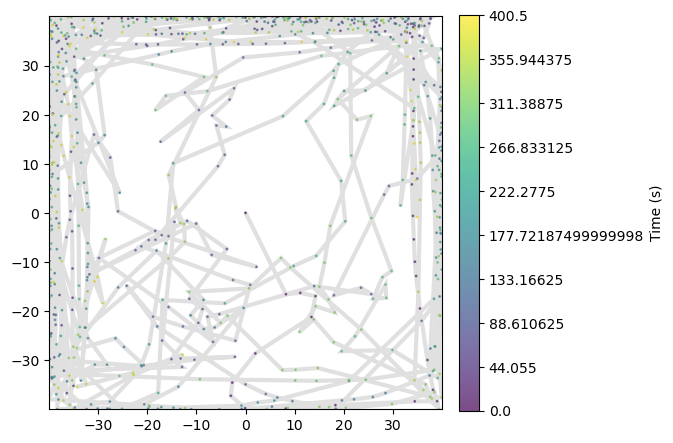

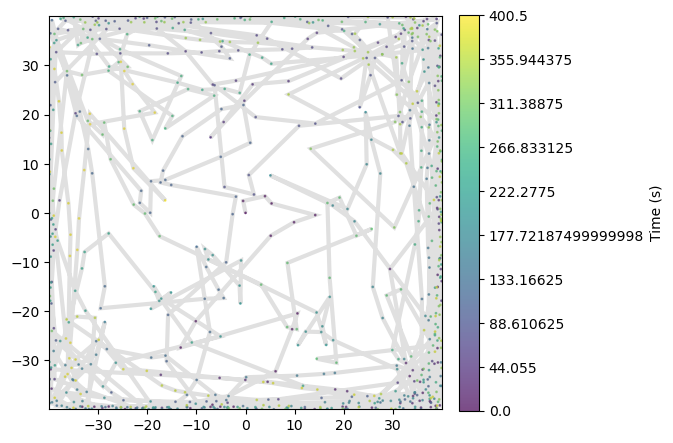

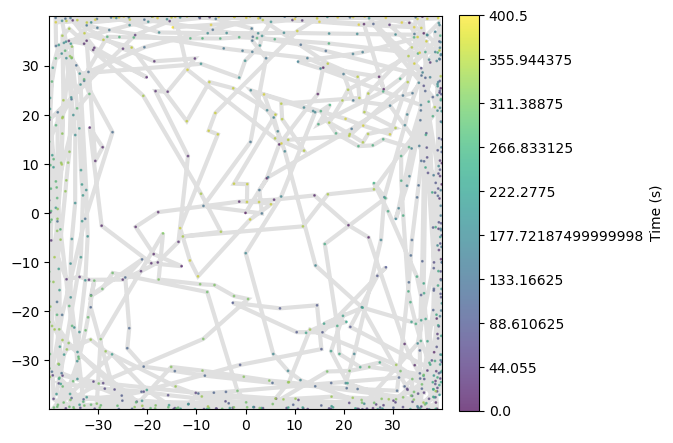

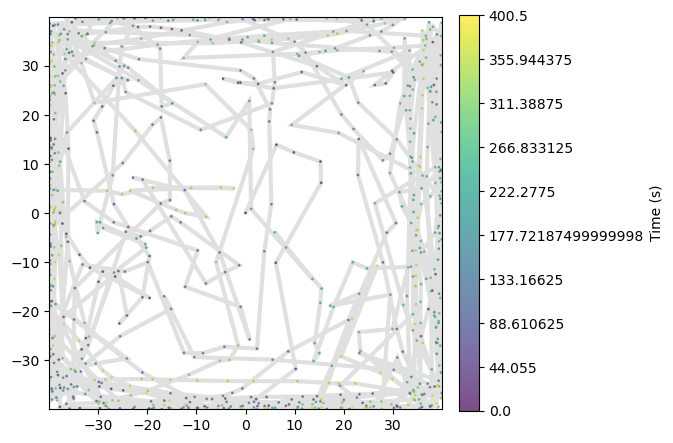

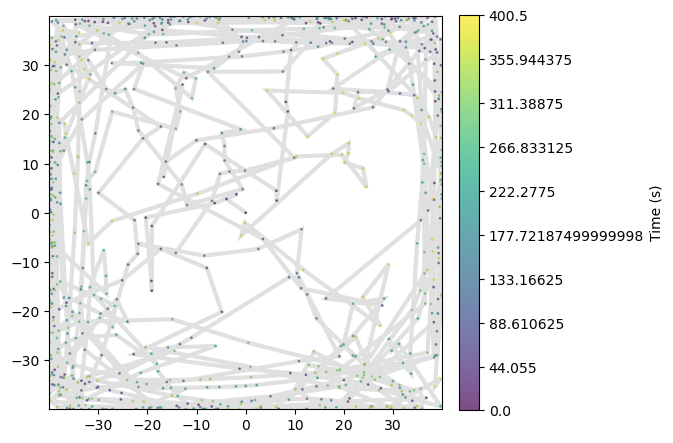

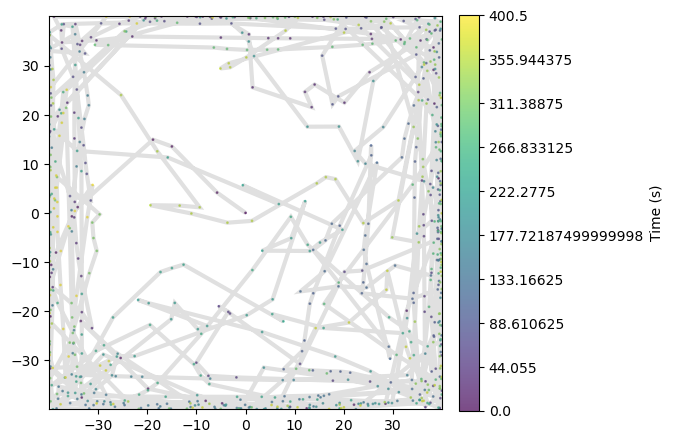

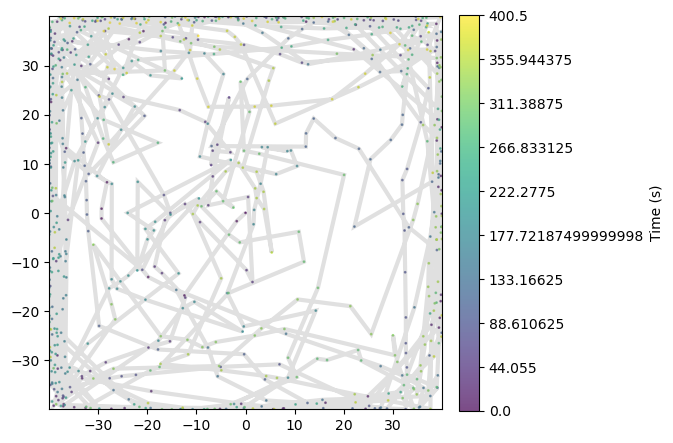

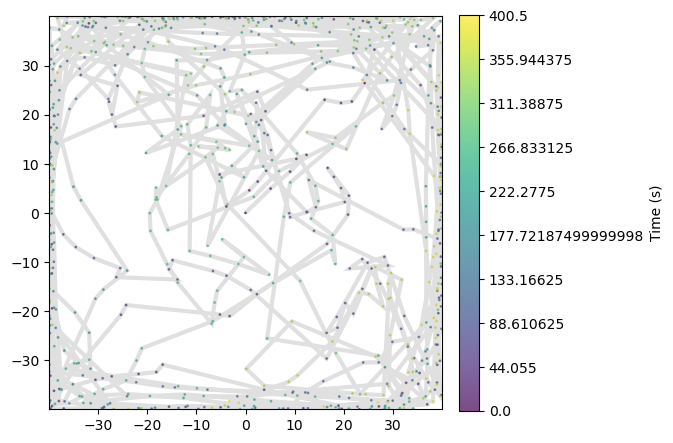

In [11]:
dfs_fund = {}
for i in range(8):
    dfs_fund[str(i)]=openFile2('C:\\Users\\Lenovo\\1navigation\\stepdfs\\fund_mod_' + str(i)+'.csv')

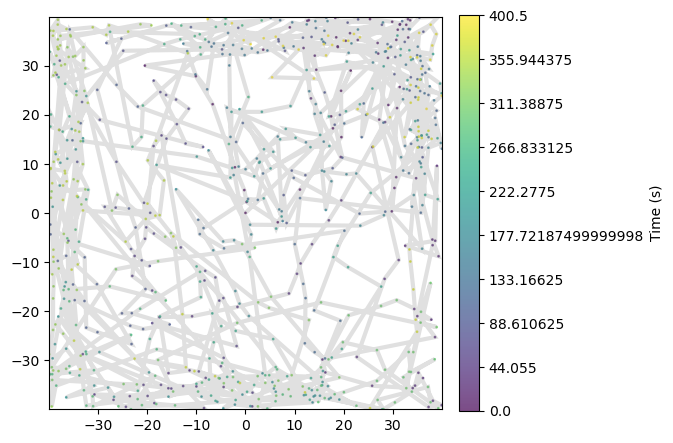

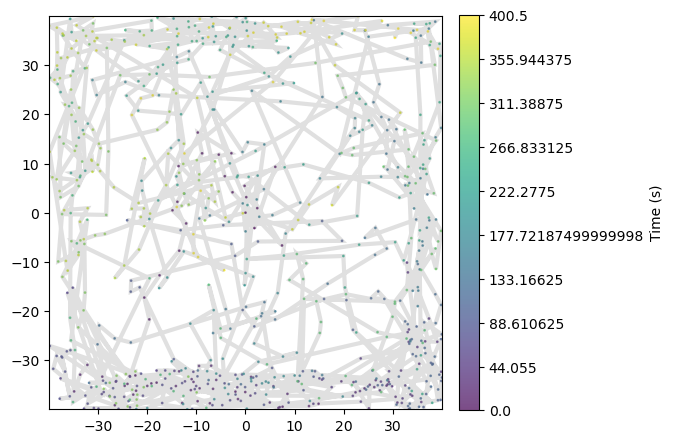

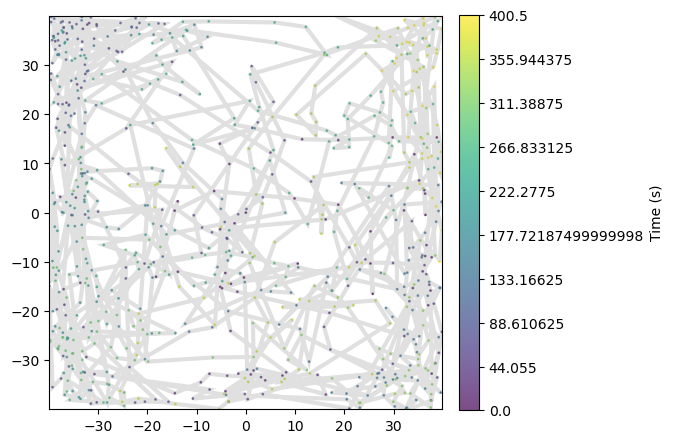

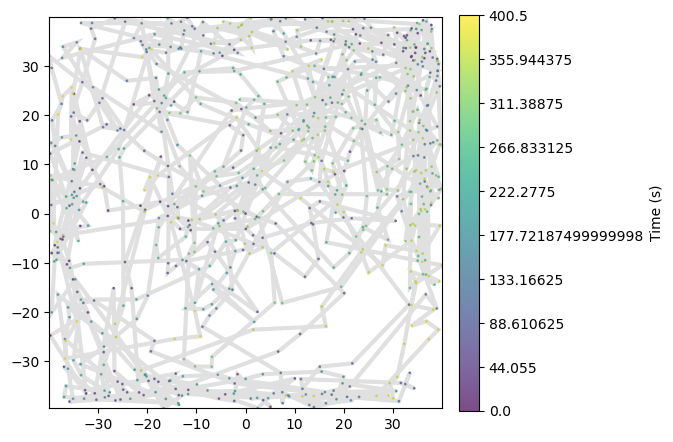

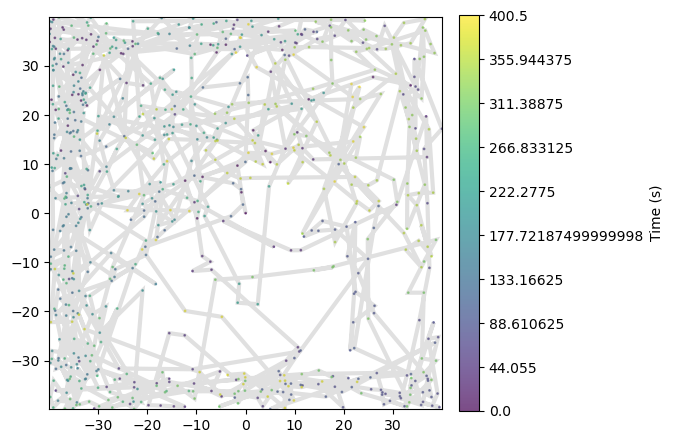

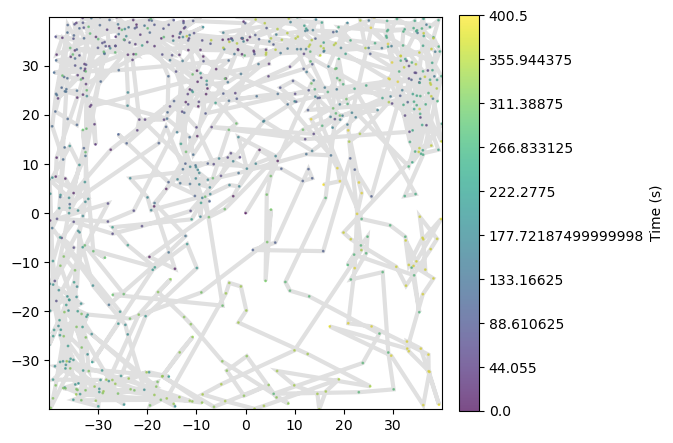

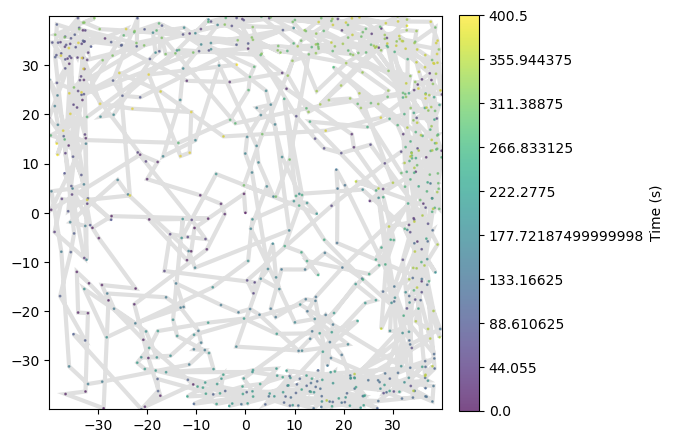

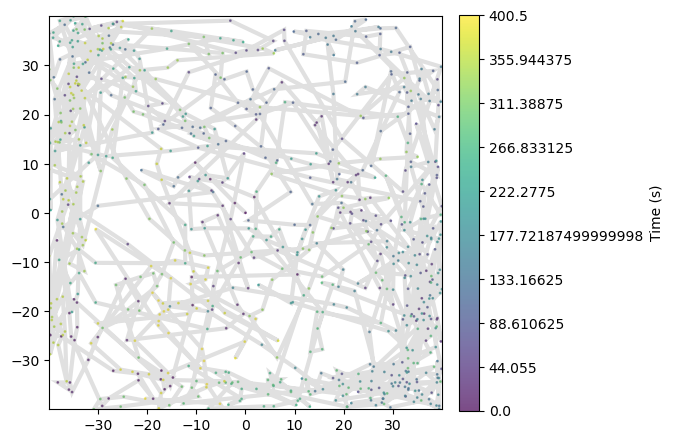

In [12]:
dfs_datam = {}
for i in range(8):
    dfs_datam[str(i)]=openFile2('C:\\Users\\Lenovo\\1navigation\\stepdfs\\realdata_mod_' + str(i)+'.csv')

In [13]:
names

['tr4', 'tr3', 'tr5', 'tr6', 'tr7', 'tr91', 'tr1', 'tr2']

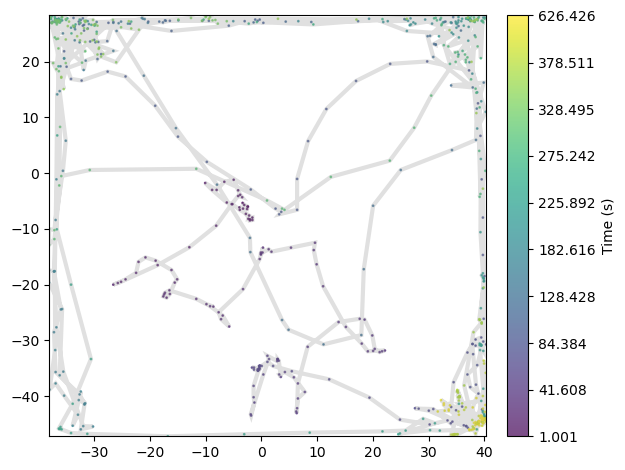

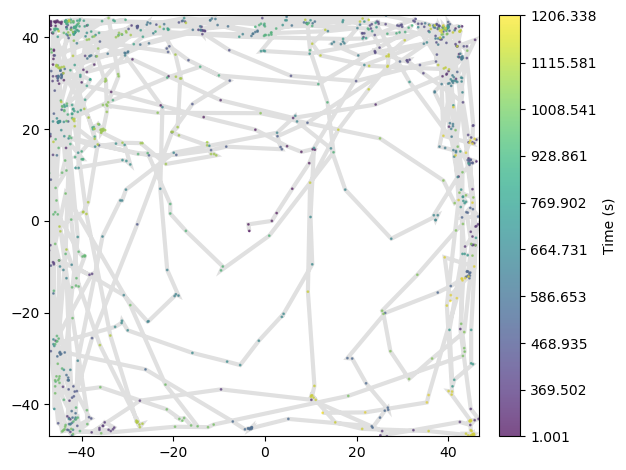

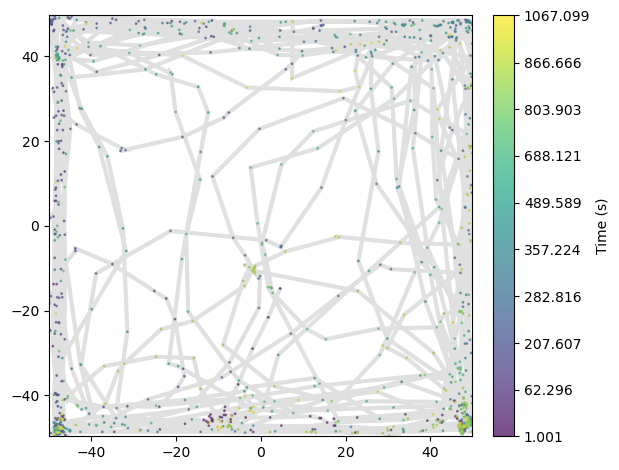

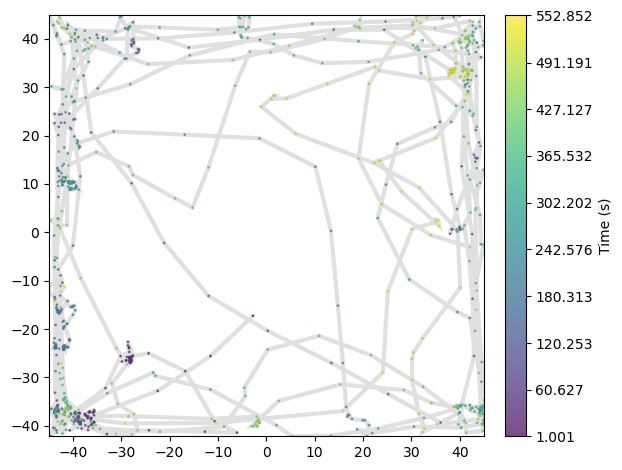

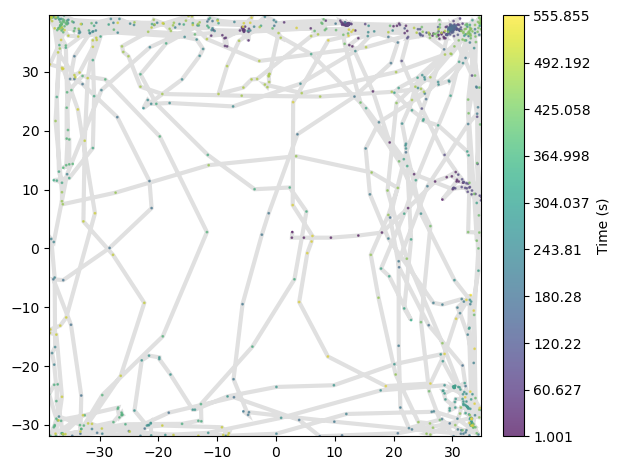

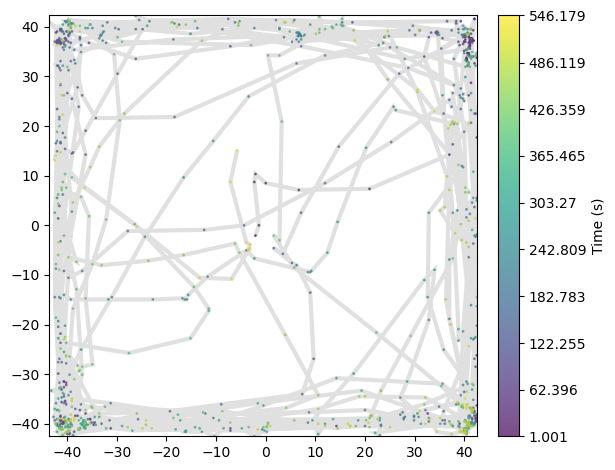

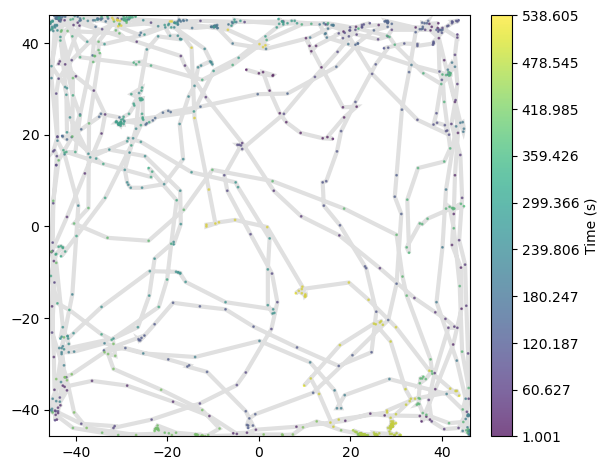

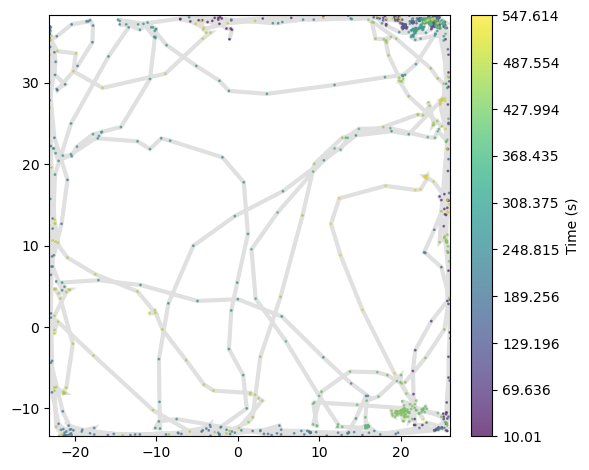

In [14]:
for i in dfs_step:
    traja.plot(dfs_step[i].iloc[0:1075])

In [15]:
del names[0]
del dfs[0]

##### просто посчитаем статистику сколько мышь проводит в углах в разных моделях

In [16]:
from statistics import mean
kk = []
for i in dfs_step:
    n = len(dfs_step[i].loc[dfs_step[i]['near_wall']>=10]) / len(dfs_step[i])
    print(n)
    kk.append(n)
print('mean', mean(kk))

0.41336971350613916
0.21693491952414276
0.3412197686645636
0.36199376947040496
0.38922731644757935
0.26910781749491425
0.38738224379103625
0.40235159162603956
mean 0.3476983925656025


In [17]:
kk = []
for i in dfs_fund:
    n = len(dfs_fund[i].loc[dfs_fund[i]['near']>=10]) / len(dfs_fund[i])
    print(n)
    kk.append(n)
print('mean', mean(kk))

0.14357053682896379
0.1760299625468165
0.1772784019975031
0.14856429463171036
0.13982521847690388
0.149812734082397
0.16229712858926343
0.10861423220973783
mean 0.150749063670412


In [18]:
kk = []
for i in dfs_datam:
    n = len(dfs_datam[i].loc[dfs_datam[i]['near']>=10]) / len(dfs_datam[i])
    print(n)
    kk.append(n)
print('mean', mean(kk))

0.08114856429463171
0.08114856429463171
0.11735330836454431
0.0599250936329588
0.0986267166042447
0.07865168539325842
0.07740324594257178
0.0749063670411985
mean 0.08364544319600499


## построим карты оккупации

In [19]:
dfs_step['tr5']

,time,x,y,Vx,Vy,V,angles,delta_angle,near_wall
0,1.001,4.578,-14.767,0.000000,0.000000,0.000000,236.250280,0.000000,0
1,1.502,1.772,-21.560,-8.676471,-21.735294,23.403080,248.238704,11.988424,0
2,2.035,-1.920,-28.943,-8.969697,-17.878788,20.002663,243.357312,-4.881392,0
3,2.536,-5.316,-37.361,-4.484848,-22.393939,22.838616,258.675158,15.317846,0
4,3.036,-8.565,-43.563,0.000000,0.000000,0.000000,NaN,NaN,3
...,...,...,...,...,...,...,...,...,...
1897,1752.317,-33.373,-40.609,0.000000,0.000000,0.000000,NaN,NaN,3
1898,1752.818,-33.373,-41.643,4.352941,0.000000,4.352941,0.000000,NaN,3
1899,1753.318,-37.951,-41.643,-40.272727,-4.484848,40.521678,186.354387,-173.645613,3
1900,1753.819,-47.550,-44.301,-13.029412,-13.029412,18.426371,225.000000,38.645613,30


In [20]:
def occupMapNorm(df):
    xmin = df["x"].min() - 0.1
    xmax = df["x"].max() + 0.1
    binx = np.linspace(xmin, xmax, 11)
    x_cut = pd.cut(df.x, binx, right=False)
    #делаем df где будет понятно сколько было точек в каждом бине 
    #соответсвуеющему данному интервалу х и данному интервалу у
    ymin = df["y"].min() - 0.1
    ymax = df["y"].max() + 0.1
    biny = np.linspace(ymin, ymax, 11)
    y_cut = pd.cut(df.y, biny, right=False)
    dfn = df.groupby([x_cut, y_cut]).count()
    
    print(x_cut.isnull().values.any(), y_cut.isnull().values.any())
    
    #dfn = dfn.drop(columns=['x','y'])
    dfn = dfn.loc[:, 'time']
    dfn = dfn.to_frame()
    dfn = dfn.rename(columns={'time': 'Count'})
    
    #сделаем df с норм числами в индексах, а не с интервалами
    L = [(a.mid, b.mid) for a, b in dfn.index]
    dfm = dfn.set_index(pd.MultiIndex.from_tuples(L, names=dfn.index.names))
    
    dd = dfm.unstack()
    dd = dd.replace(0, 1.e-1)
    arrd = dd.to_numpy()
    arrl = np.log(arrd)
    arrsrsr = np.sqrt(np.sqrt(np.sqrt(arrd)))
    #sns.heatmap(arrl, square=True)
    plt.figure()
    sns.heatmap(arrl, square=True, xticklabels=False, yticklabels=False)
    plt.show()
    return(arrl)
    

In [21]:
def minmax(occ):
    if isinstance(occ, pd.DataFrame):
        occ = occ.to_numpy()
    #print(np.amin(occ))
    #print(np.amax(occ))
    kk = (occ - np.amin(occ)) / (np.amax(occ) - np.amin(occ))
    kl = pd.DataFrame(kk)
    #print(kl)
    sns.heatmap(kl, square=True, xticklabels=False, yticklabels=False)
    return kk

In [22]:
dfs_step['tr5']

,time,x,y,Vx,Vy,V,angles,delta_angle,near_wall
0,1.001,4.578,-14.767,0.000000,0.000000,0.000000,236.250280,0.000000,0
1,1.502,1.772,-21.560,-8.676471,-21.735294,23.403080,248.238704,11.988424,0
2,2.035,-1.920,-28.943,-8.969697,-17.878788,20.002663,243.357312,-4.881392,0
3,2.536,-5.316,-37.361,-4.484848,-22.393939,22.838616,258.675158,15.317846,0
4,3.036,-8.565,-43.563,0.000000,0.000000,0.000000,NaN,NaN,3
...,...,...,...,...,...,...,...,...,...
1897,1752.317,-33.373,-40.609,0.000000,0.000000,0.000000,NaN,NaN,3
1898,1752.818,-33.373,-41.643,4.352941,0.000000,4.352941,0.000000,NaN,3
1899,1753.318,-37.951,-41.643,-40.272727,-4.484848,40.521678,186.354387,-173.645613,3
1900,1753.819,-47.550,-44.301,-13.029412,-13.029412,18.426371,225.000000,38.645613,30


False False


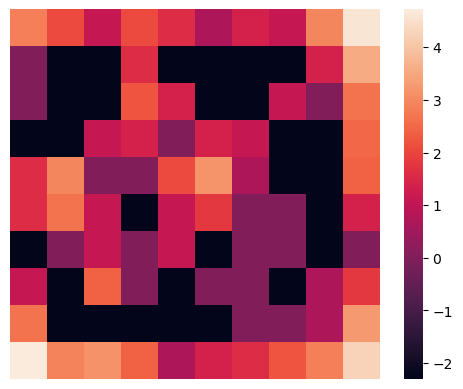

False False


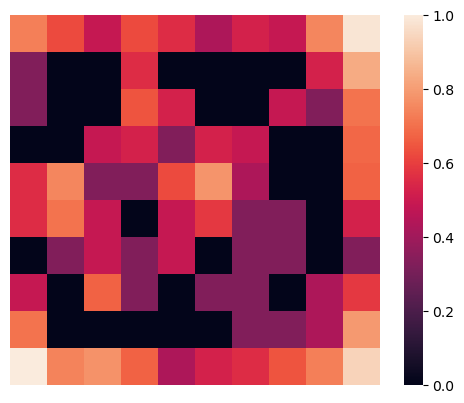

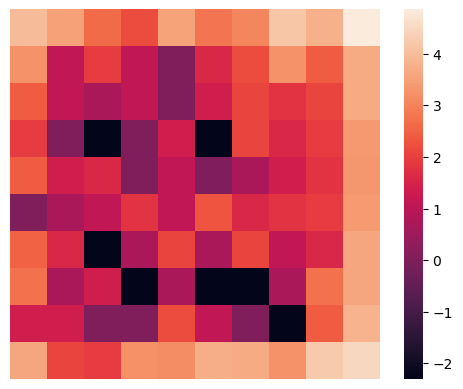

False False


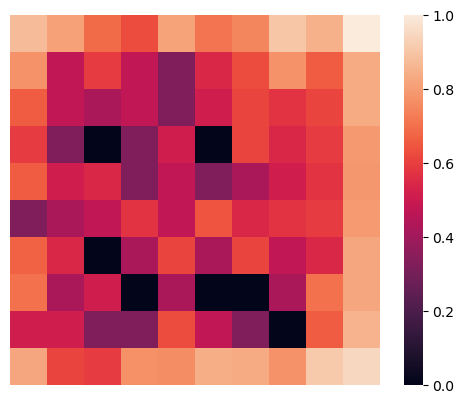

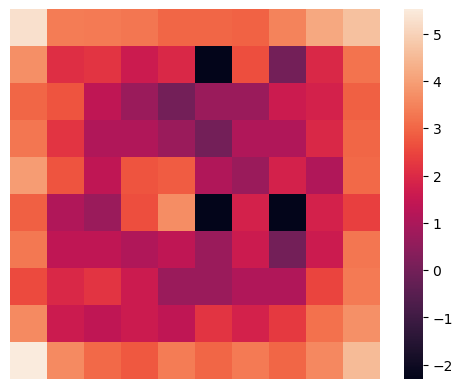

False False


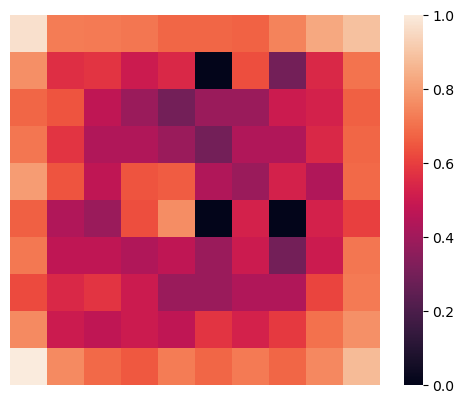

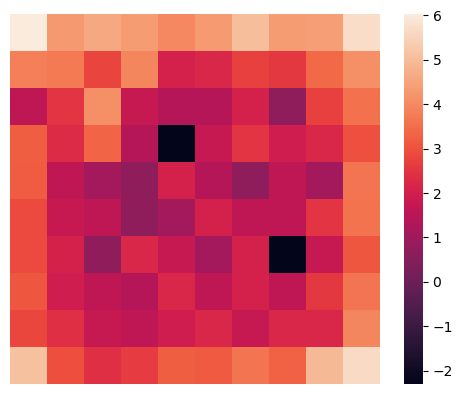

False False


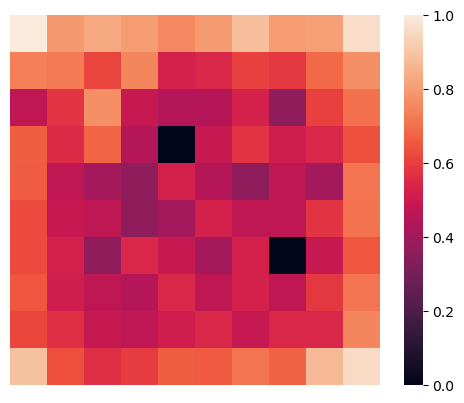

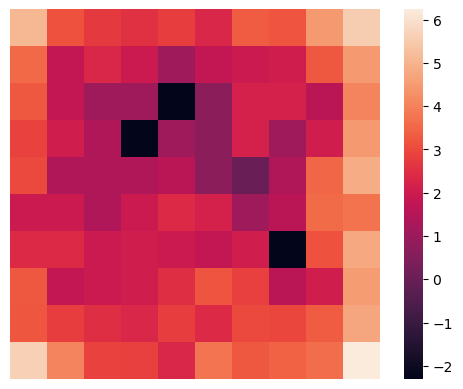

False False


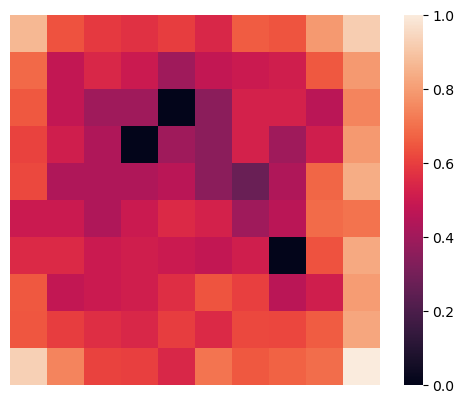

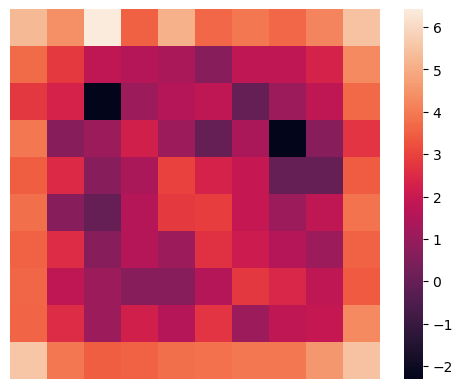

False False


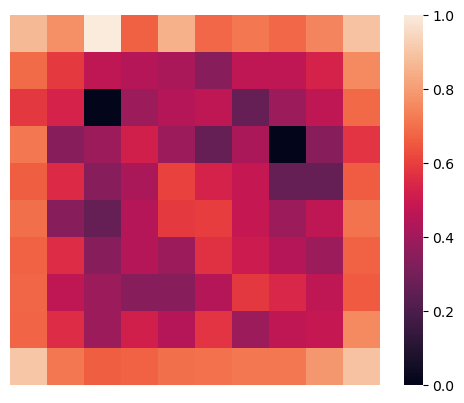

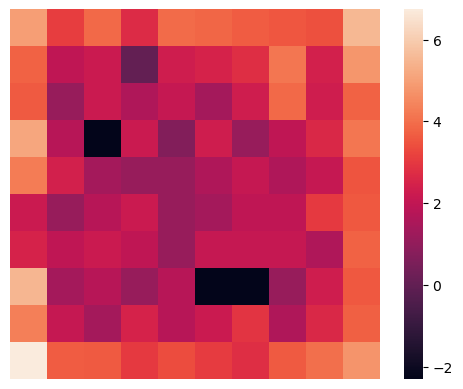

False False


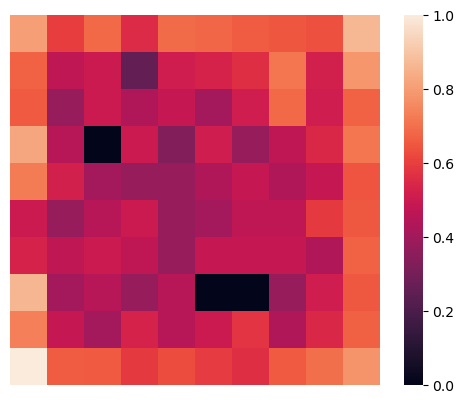

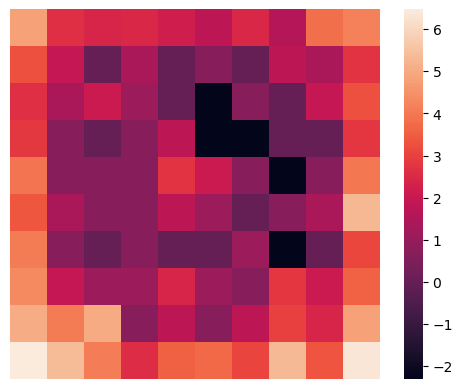

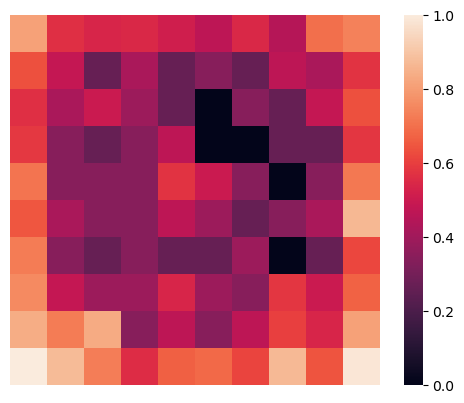

In [23]:
occ_step = {}
for i in dfs_step:
    occ_step[i] = occupMapNorm(dfs_step[i])
    occ_step[i] = minmax(occ_step[i])

False False


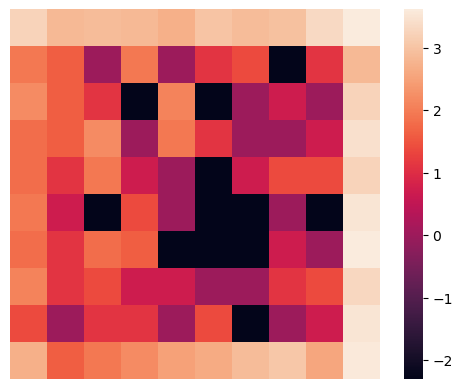

False False


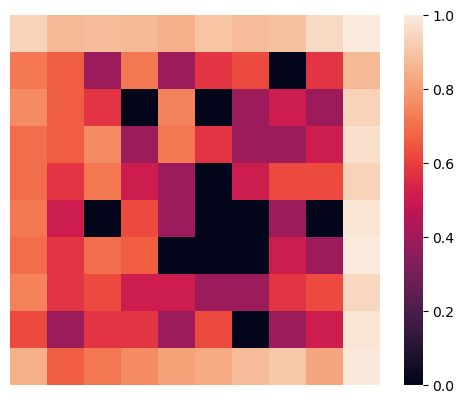

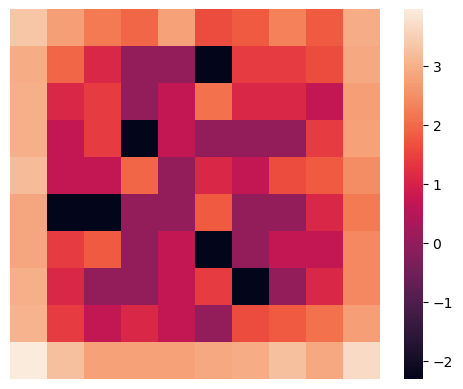

False False


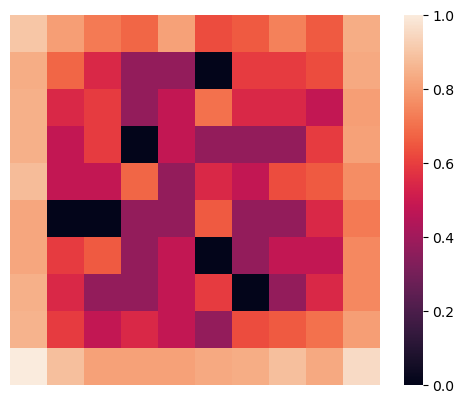

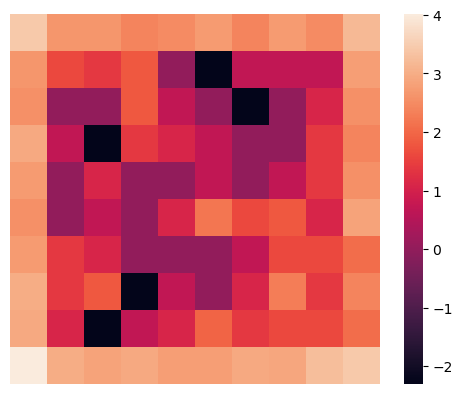

False False


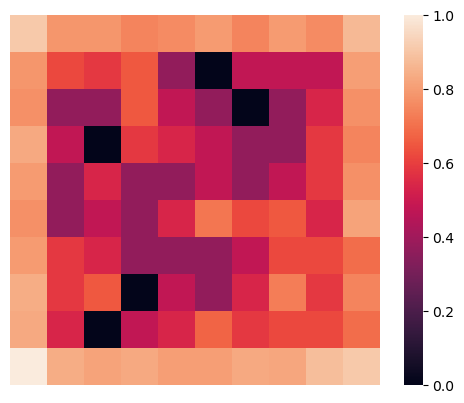

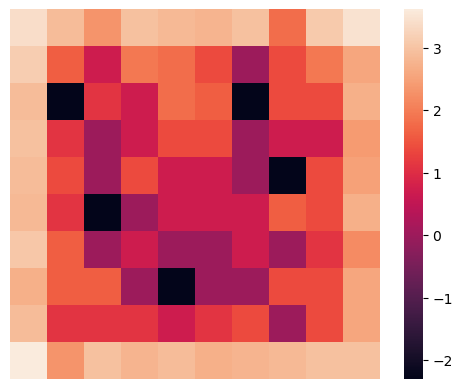

False False


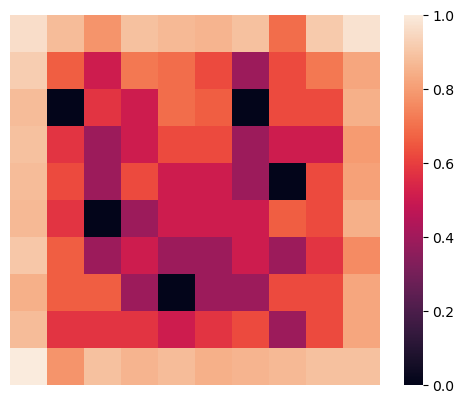

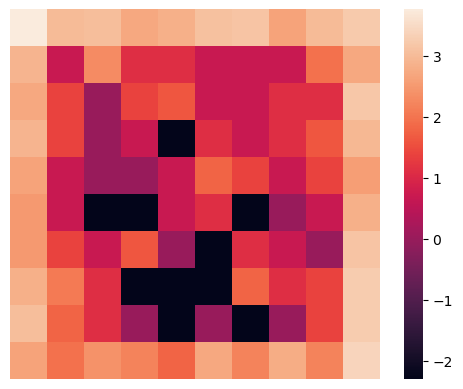

False False


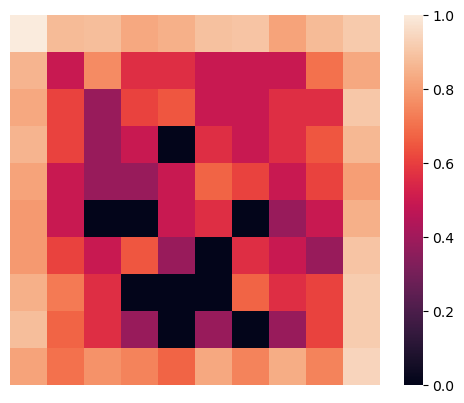

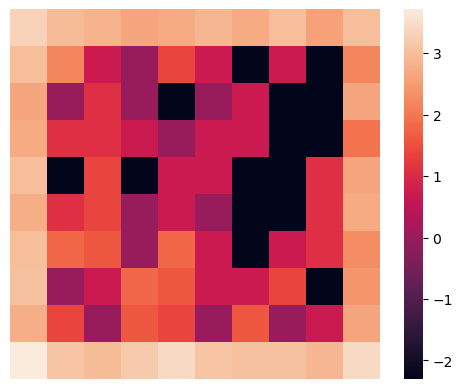

False False


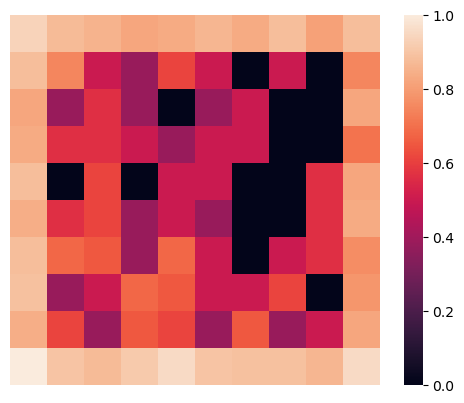

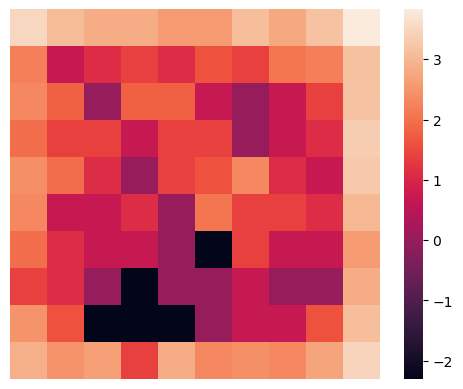

False False


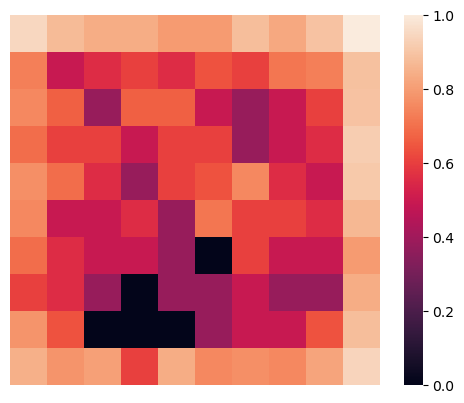

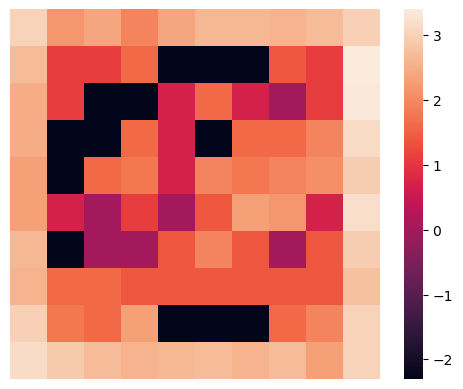

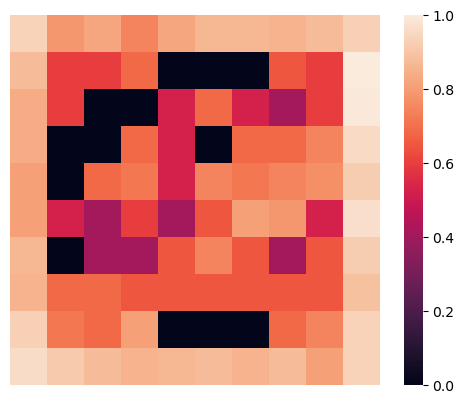

In [24]:
occ_fund = {}
for i in dfs_fund:
    occ_fund[i] = occupMapNorm(dfs_fund[i])
    occ_fund[i] = minmax(occ_fund[i])

False False


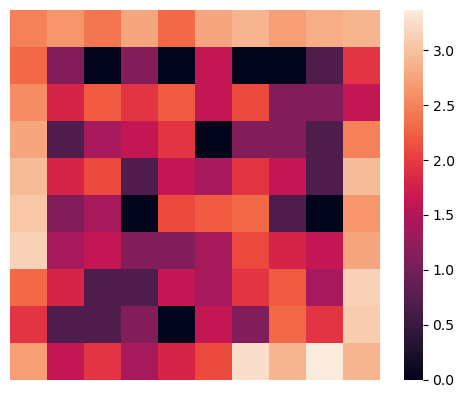

False False


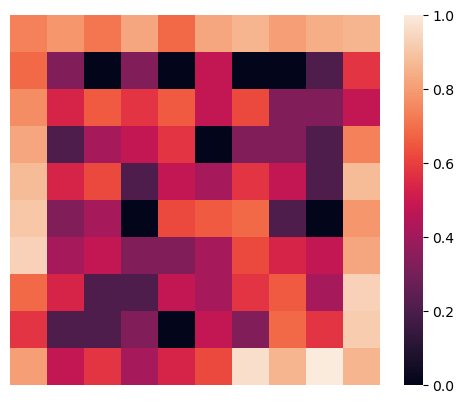

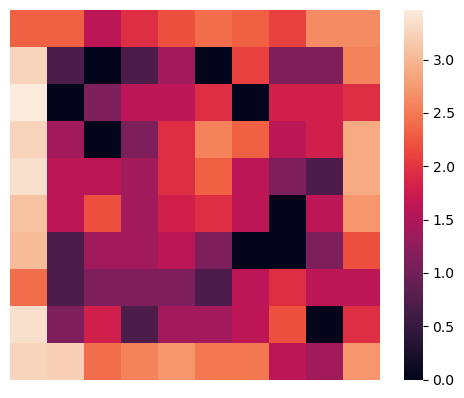

False False


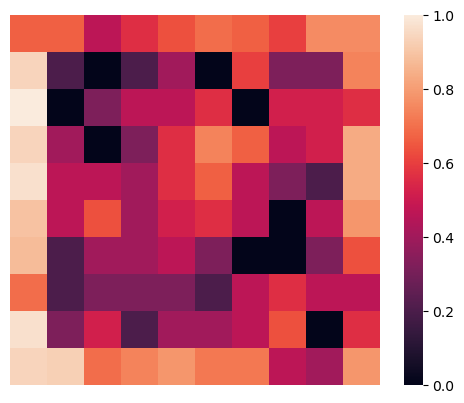

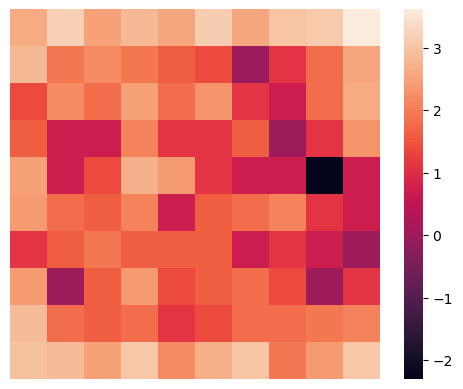

False False


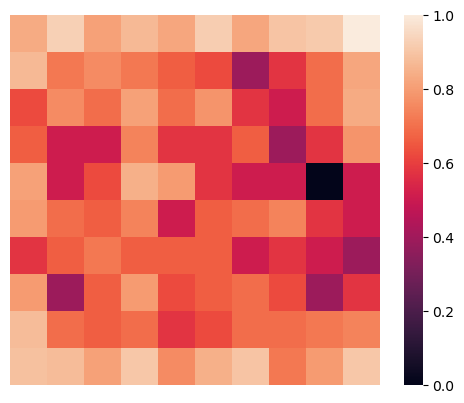

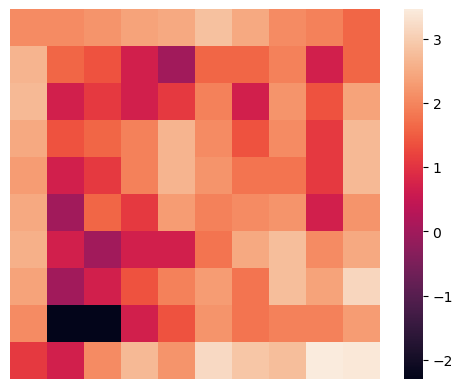

False False


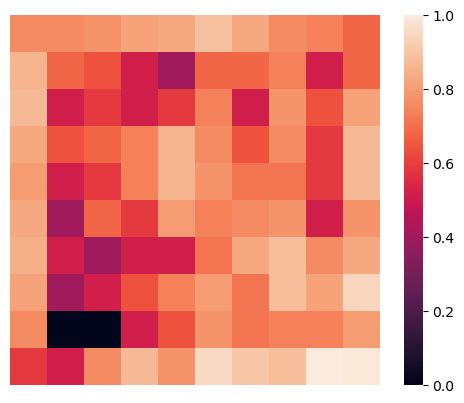

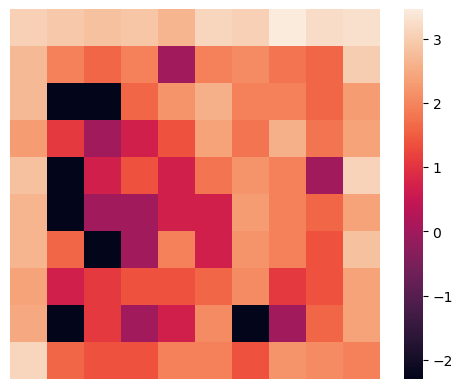

False False


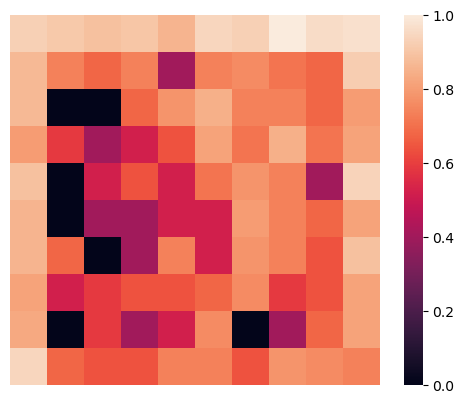

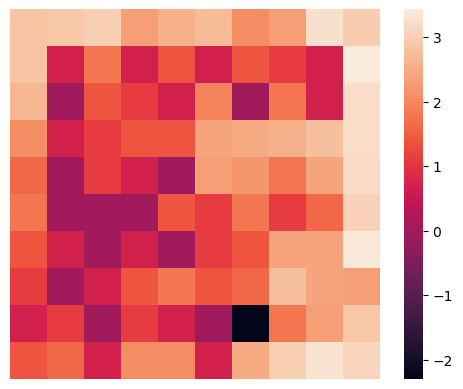

False False


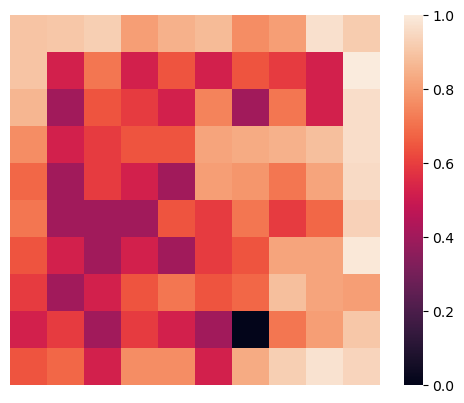

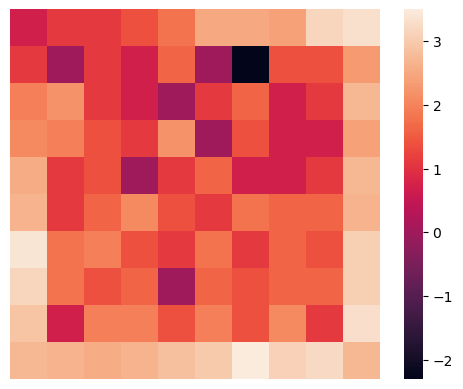

False False


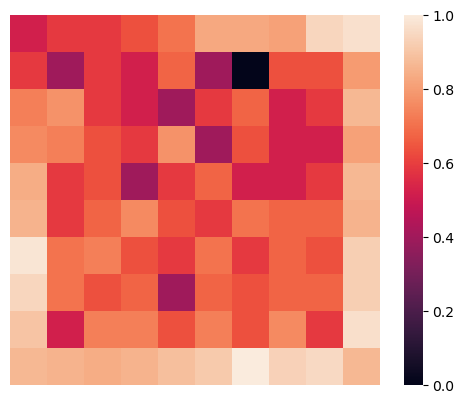

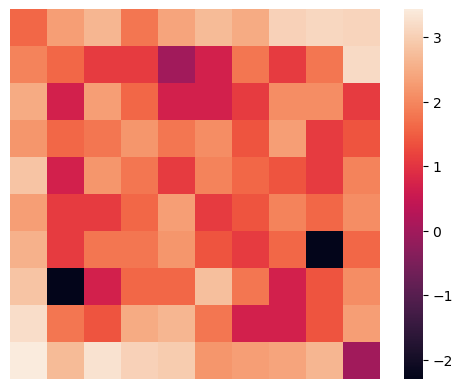

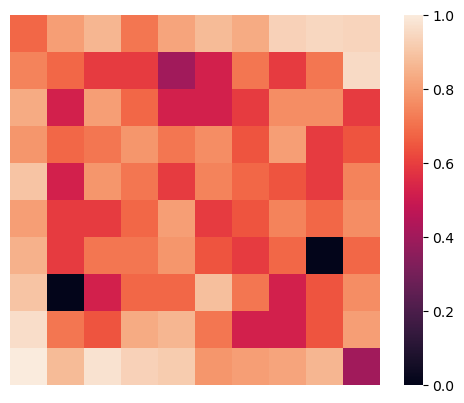

In [25]:
occ_datam = {}
for i in dfs_datam:
    occ_datam[i] = occupMapNorm(dfs_datam[i])
    occ_datam[i] = minmax(occ_datam[i])

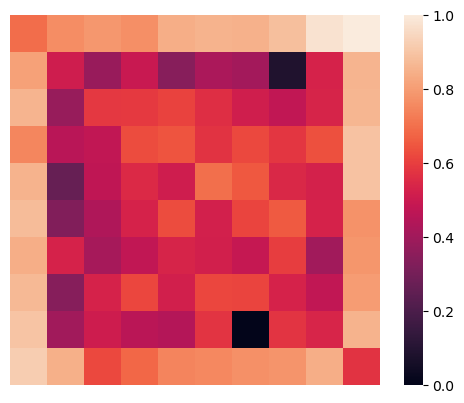

In [26]:
av_datam = np.empty([10, 10])
for i in occ_datam:
    av_datam += occ_datam[i]
av_datam = minmax(av_datam)

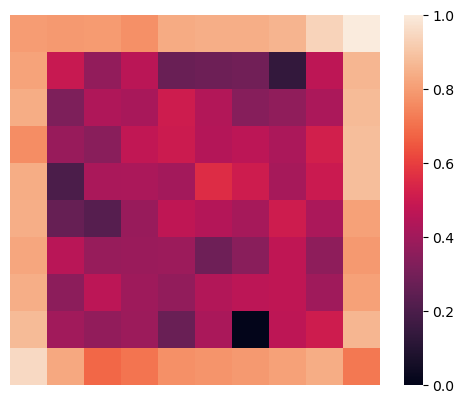

In [27]:
av_fund = np.empty([10, 10])
for i in occ_fund:
    av_fund += occ_fund[i]
av_fund = minmax(av_fund)

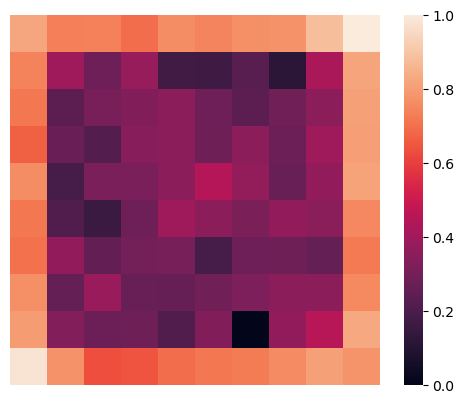

In [28]:
av_step = np.empty([10, 10])
for i in occ_step:
    av_step += occ_step[i]
av_step = minmax(av_step)

## давайте сделаем статистику какой процент временти мышь тусит у стен

In [54]:
from statistics import mean
kkr = []
for i in dfs_step:
    n = len(dfs_step[i].loc[(dfs_step[i]['near_wall']>=1) & (dfs_step[i]['near_wall']<=4)])/ len(dfs_step[i])
    print(n)
    kkr.append(n)
print('mean', mean(kkr))

0.3765347885402456
0.5864240727781665
0.4547844374342797
0.4504672897196262
0.42834241744148766
0.6160999709386806
0.4567513559805881
0.47261256094063664
mean 0.4802521117217139


In [56]:
kkf = []
for i in dfs_fund:
    n = len(dfs_fund[i].loc[(dfs_fund[i]['near']>=1) & (dfs_fund[i]['near']<=4)])/ len(dfs_fund[i])
    #n = len(dfs_fund[i].loc[dfs_fund[i]['near']>=1]) / len(dfs_fund[i])
    print(n)
    kkf.append(n)
print('mean', mean(kkf))

0.6666666666666666
0.6117353308364545
0.6004993757802747
0.634207240948814
0.6579275905118602
0.6853932584269663
0.6004993757802747
0.616729088639201
mean 0.634207240948814


In [57]:
kkd = []
for i in dfs_datam:
    #n = len(dfs_datam[i].loc[dfs_datam[i]['near']>=1]) / len(dfs_datam[i])
    n = len(dfs_datam[i].loc[(dfs_datam[i]['near']>=1) & (dfs_datam[i]['near']<=4)])/ len(dfs_datam[i])
    print(n)
    kkd.append(n)
print('mean', mean(kkd))

0.5742821473158551
0.5730337078651685
0.4918851435705368
0.5006242197253433
0.5493133583021224
0.5568039950062422
0.6054931335830213
0.5230961298377028
mean 0.5468164794007491


In [41]:
import numpy as np
from scipy import stats

## старое: стены и углы

In [50]:
stats.mannwhitneyu(kkr, kkf)

MannwhitneyuResult(statistic=54.0, pvalue=0.020668220668220667)

In [51]:
stats.mannwhitneyu(kkr, kkd)

MannwhitneyuResult(statistic=64.0, pvalue=0.0001554001554001554)

In [47]:
stats.ttest_ind(kkr, kkf, equal_var=False)

Ttest_indResult(statistic=2.4965838986006563, pvalue=0.02579391988519358)

In [48]:
stats.ttest_ind(kkr, kkd, equal_var=False)

Ttest_indResult(statistic=10.495135424618747, pvalue=5.3966451774720894e-08)

### новое только углы

In [59]:
stats.ttest_ind(kkr, kkf, equal_var=False)

Ttest_indResult(statistic=-5.021243128952486, pvalue=0.0006707375887526234)

In [60]:
stats.ttest_ind(kkr, kkd, equal_var=False)

Ttest_indResult(statistic=-2.1043887064615787, pvalue=0.061266833221848664)

## новое только центр

In [61]:
from statistics import mean
kkr = []
for i in dfs_step:
    n = len(dfs_step[i].loc[dfs_step[i]['near_wall']==0])/ len(dfs_step[i])
    print(n)
    kkr.append(n)
print('mean', mean(kkr))

kkf = []
for i in dfs_fund:
    n = len(dfs_fund[i].loc[dfs_fund[i]['near']==0]) / len(dfs_fund[i])
    print(n)
    kkf.append(n)
print('mean', mean(kkf))

kkd = []
for i in dfs_datam:
    n = len(dfs_datam[i].loc[dfs_datam[i]['near']==0]) / len(dfs_datam[i])
    #n = len(dfs_datam[i].loc[(dfs_datam[i]['near']>=1) & (dfs_datam[i]['near']<=4)])/ len(dfs_datam[i])
    print(n)
    kkd.append(n)
print('mean', mean(kkd))

0.2100954979536153
0.1966410076976907
0.20399579390115669
0.18753894080996886
0.182430266110933
0.11479221156640511
0.15586640022837567
0.12503584743332377
mean 0.17204949571268363
0.18976279650436953
0.21223470661672908
0.2222222222222222
0.21722846441947566
0.20224719101123595
0.1647940074906367
0.23720349563046192
0.2746566791510612
mean 0.21504369538077403
0.3445692883895131
0.34581772784019976
0.39076154806491886
0.4394506866416979
0.352059925093633
0.3645443196004994
0.317103620474407
0.4019975031210986
mean 0.36953807740324596


In [62]:
stats.ttest_ind(kkr, kkf, equal_var=False)

Ttest_indResult(statistic=-2.4965838986006577, pvalue=0.025793919885193518)

In [63]:
stats.ttest_ind(kkr, kkd, equal_var=False)

Ttest_indResult(statistic=-10.495135424618743, pvalue=5.3966451774720834e-08)

## распределение шагов

In [76]:
def buildhist(df,n):
    #sampRate = len(df) / (df.iloc[-1]['time'] - df.iloc[0]['time'])
    #step = round(sampRate * n)
    #chose which samples will remain
    #k = []
    #if step == 0:
     #   step = 1
    #for i in range(len(df)):
     #   if i % step == 0:
      #      k.append(i)
    #df = df.iloc[k]
    
    xy = []
    x0 = df['x'][0]
    y0 = df['y'][0]
    #delX = []
    #delY = []
    for i in range(len(df)):
        dx = df.iloc[i]['x'] - x0
        dy = df.iloc[i]['y'] - y0
        xxy = pow(pow(dx, 2) + pow(dy, 2), 0.5)
        #delX.append(dx)
        #delY.append(dy)
        xy.append(xxy)
        x0 = df.iloc[i]['x']
        y0 = df.iloc[i]['y']

    if 'xy' not in df:
        df.insert(3, "xy", xy)

    xynum = df['xy'].to_numpy()
    #histogram
    plt.figure()
    y, binEdges, _ = plt.hist(xynum, bins=n, range=(2, 25))
    x = 0.5 * (binEdges[1:] + binEdges[:-1])
    plt.show()
    plt.figure()
    plt.plot(x, y)
    plt.show()
    #fourie
    #DURATION = (df.iloc[-1]['time'] - df.iloc[0]['time'])
    #SAMPLE_RATE = len(df) / DURATION
    #N = SAMPLE_RATE * DURATION
    #yf = rfft(xynum)
    #xf = rfftfreq(int(N), int(1 / SAMPLE_RATE))
    #plt.figure()
    #plt.plot(xf, np.abs(yf))
    #plt.show()
    return [x, y]
    
    
    

<Figure size 640x480 with 0 Axes>

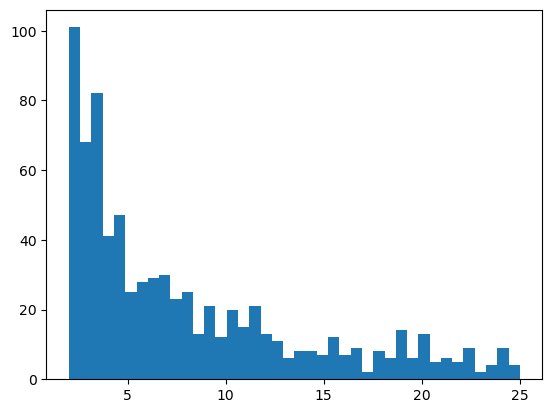

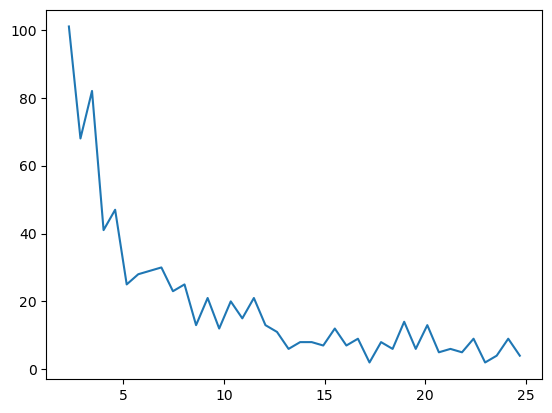

<Figure size 640x480 with 0 Axes>

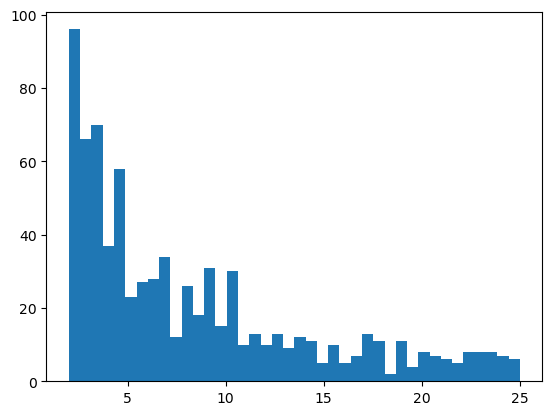

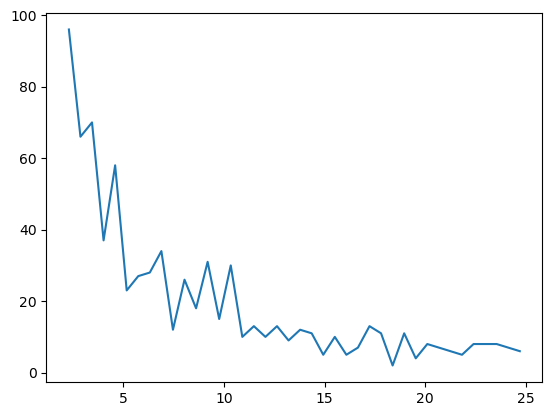

<Figure size 640x480 with 0 Axes>

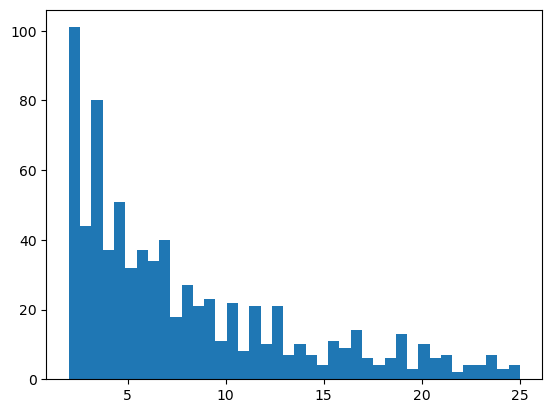

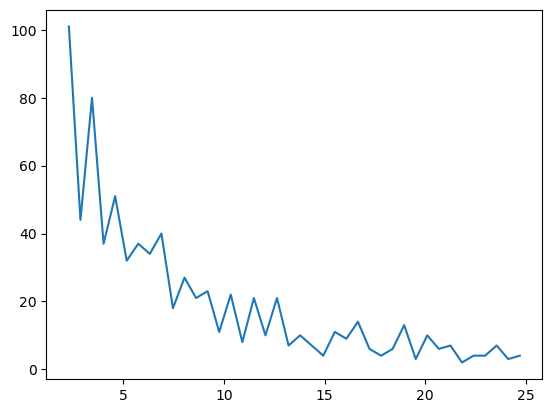

<Figure size 640x480 with 0 Axes>

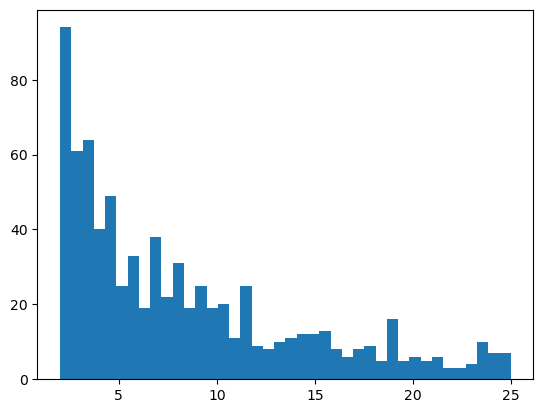

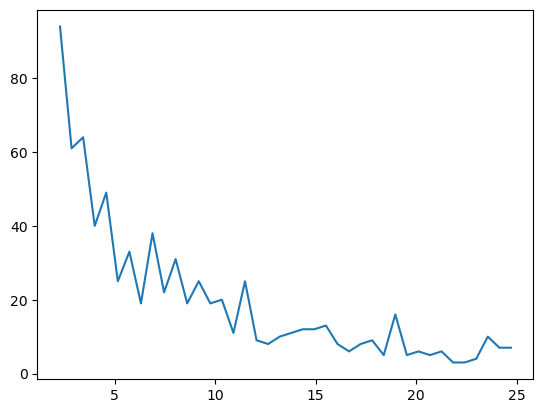

<Figure size 640x480 with 0 Axes>

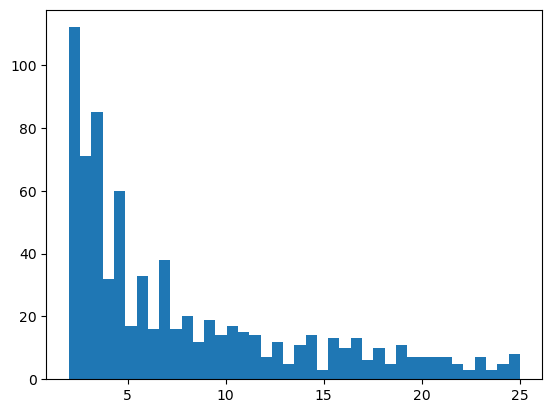

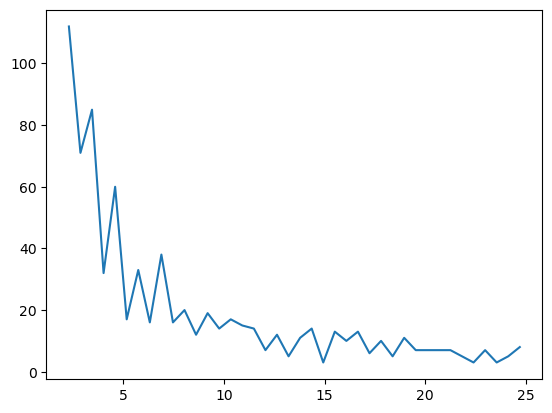

<Figure size 640x480 with 0 Axes>

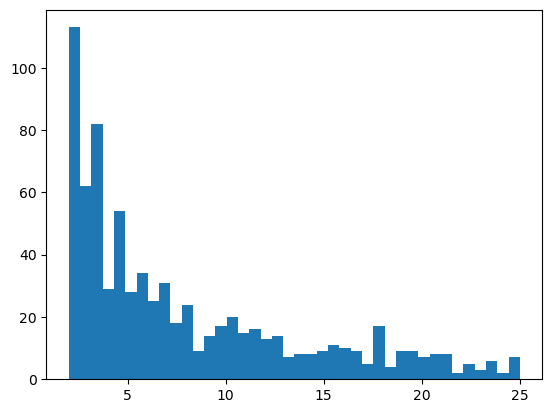

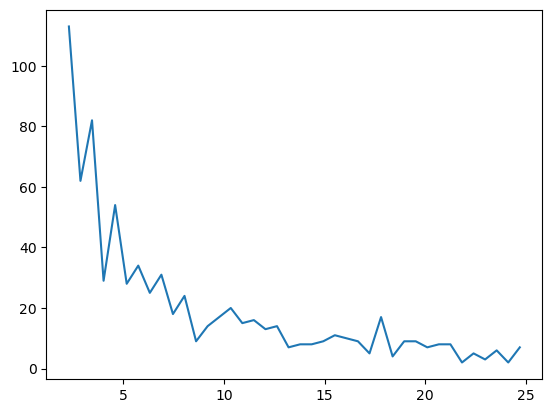

<Figure size 640x480 with 0 Axes>

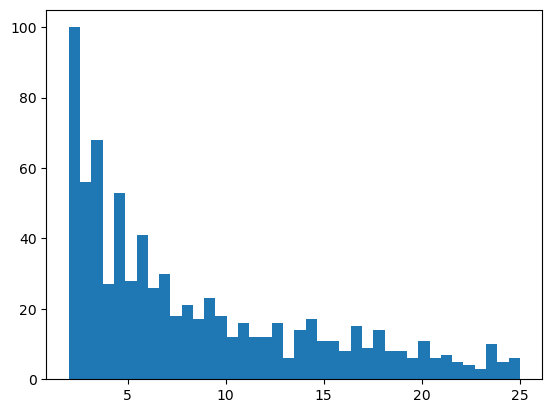

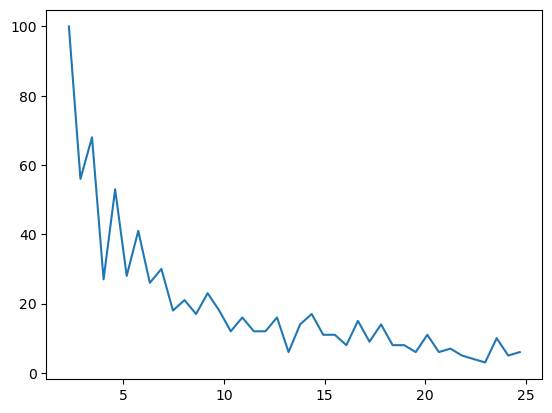

<Figure size 640x480 with 0 Axes>

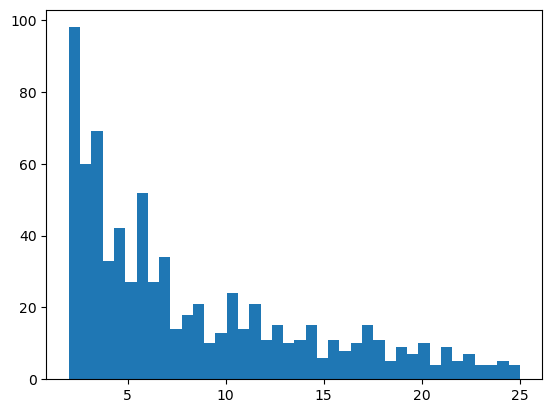

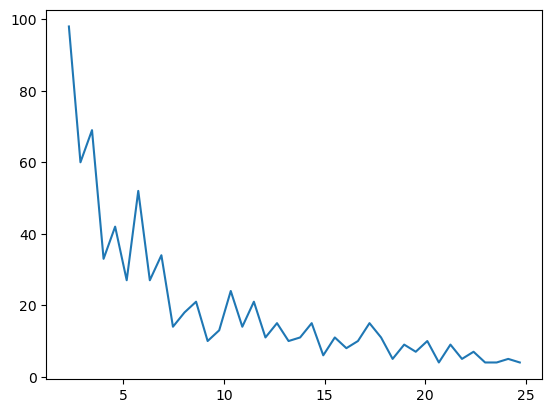

In [80]:
hist_f = []
for i in dfs_fund:
    plt.figure()
    j = buildhist(dfs_fund[i],40)
    hist_f.append(j)
    

<Figure size 640x480 with 0 Axes>

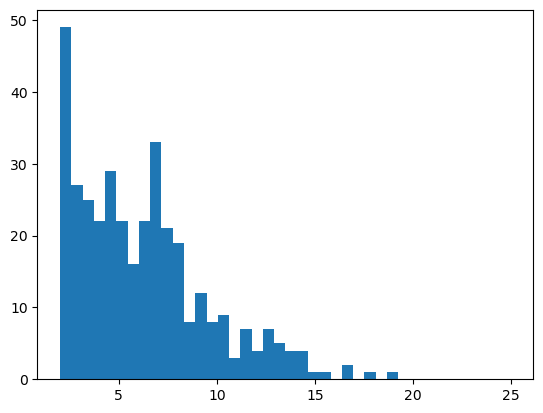

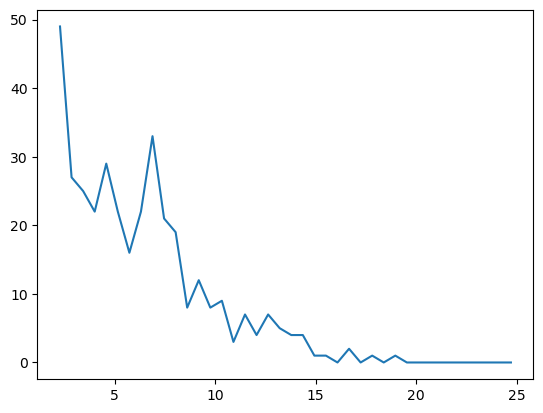

<Figure size 640x480 with 0 Axes>

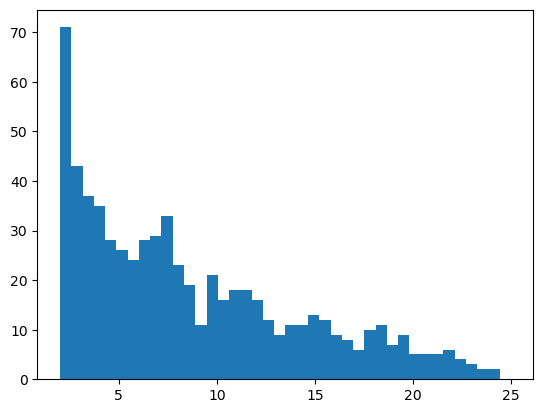

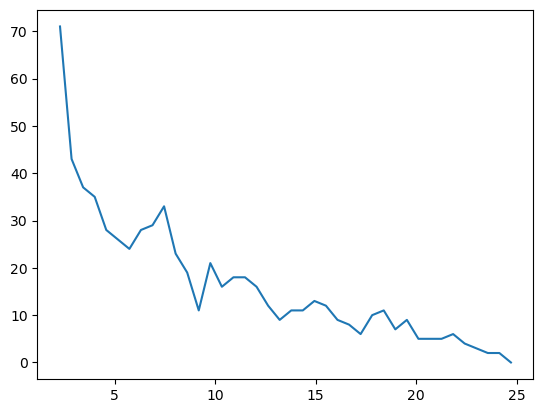

<Figure size 640x480 with 0 Axes>

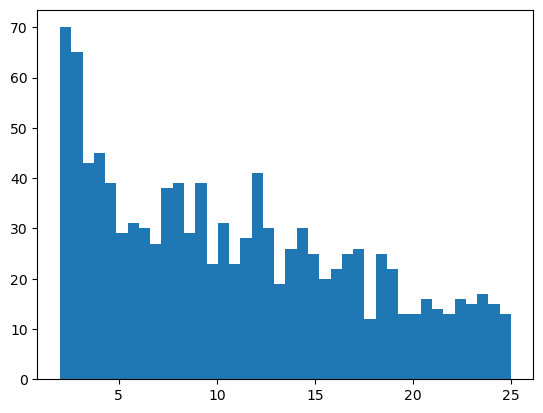

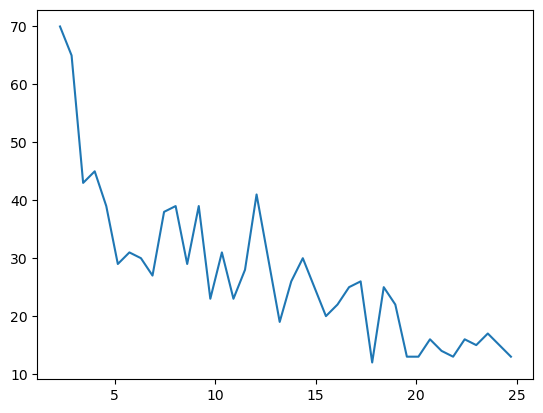

<Figure size 640x480 with 0 Axes>

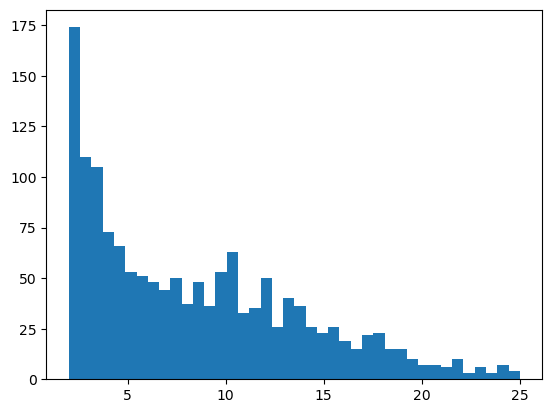

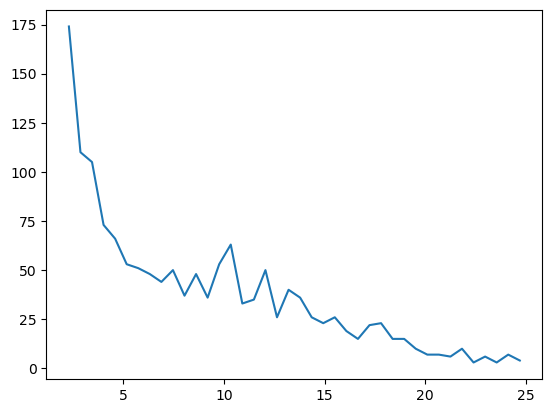

<Figure size 640x480 with 0 Axes>

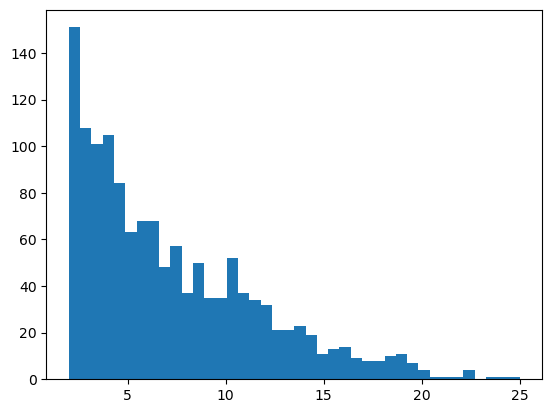

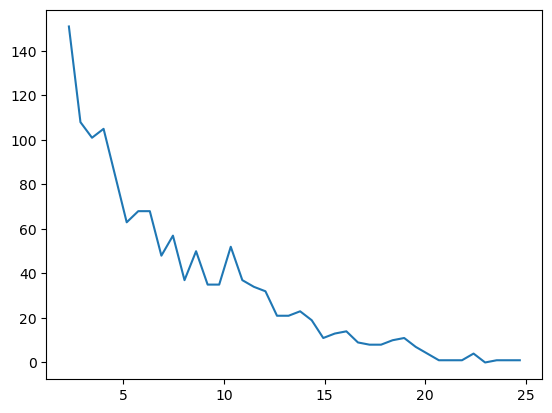

<Figure size 640x480 with 0 Axes>

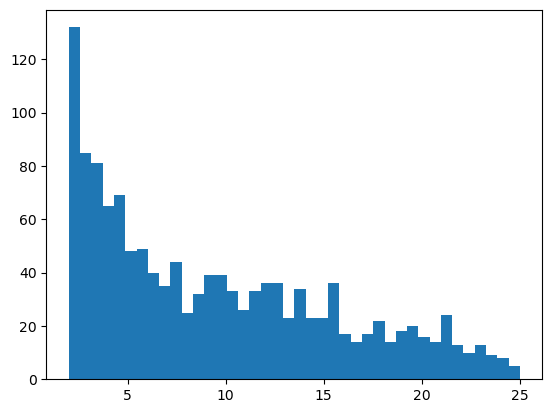

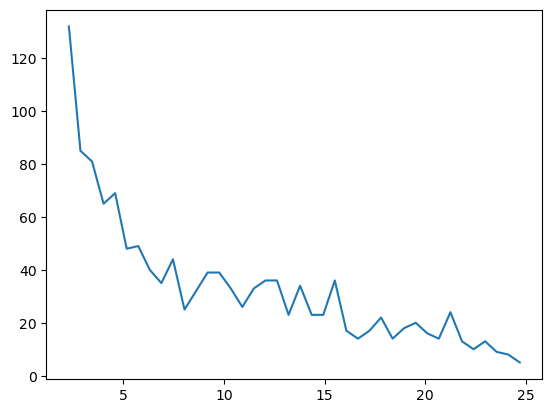

<Figure size 640x480 with 0 Axes>

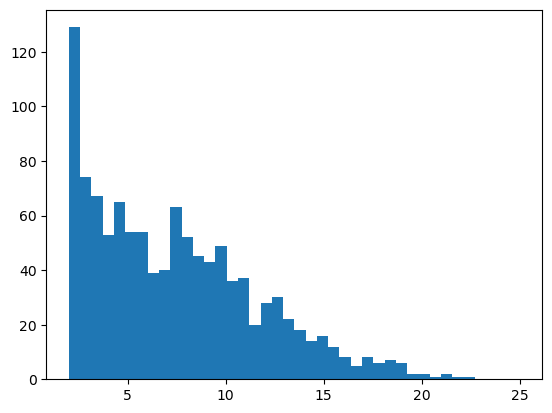

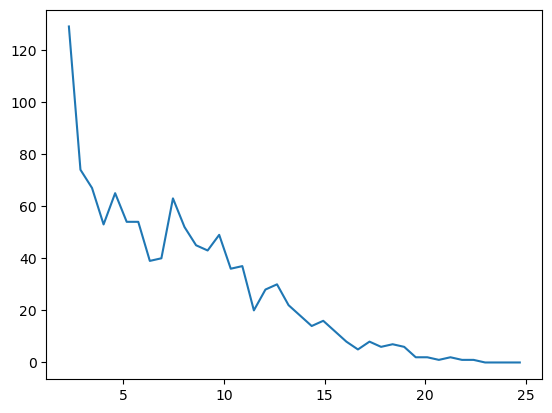

<Figure size 640x480 with 0 Axes>

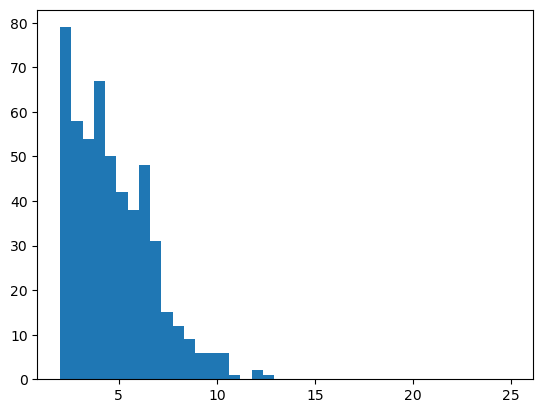

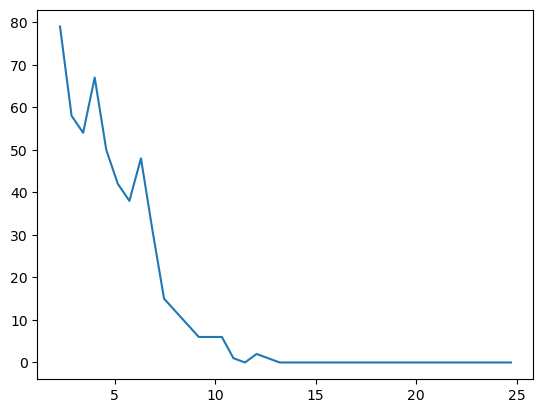

In [81]:
hist_s = []
for i in dfs_step:
    plt.figure()
    j = buildhist(dfs_step[i],40)
    hist_s.append(j)

<Figure size 640x480 with 0 Axes>

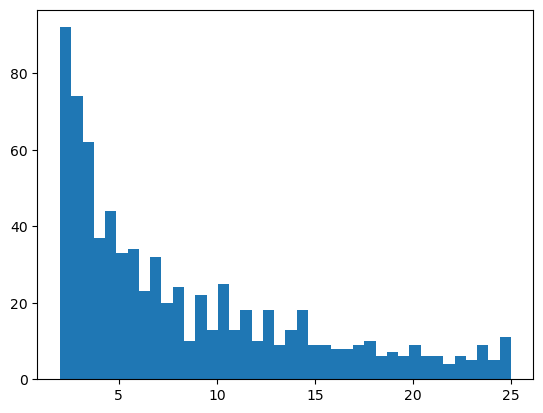

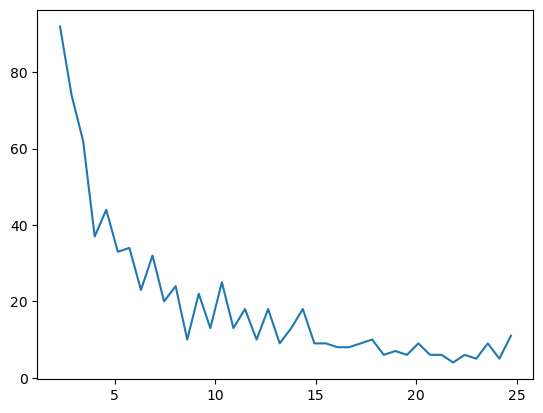

<Figure size 640x480 with 0 Axes>

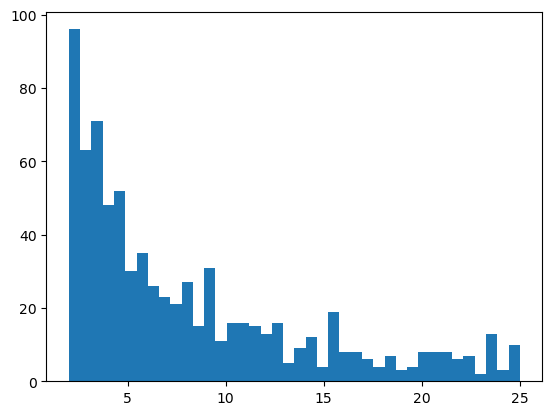

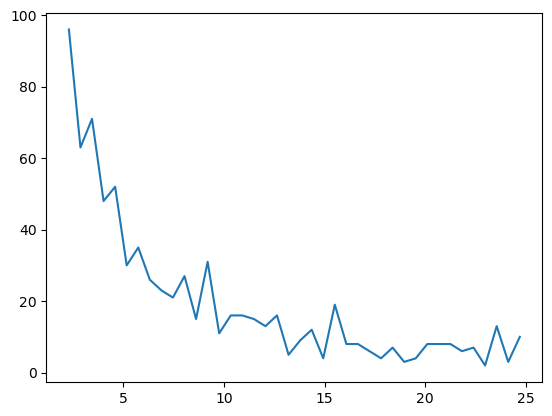

<Figure size 640x480 with 0 Axes>

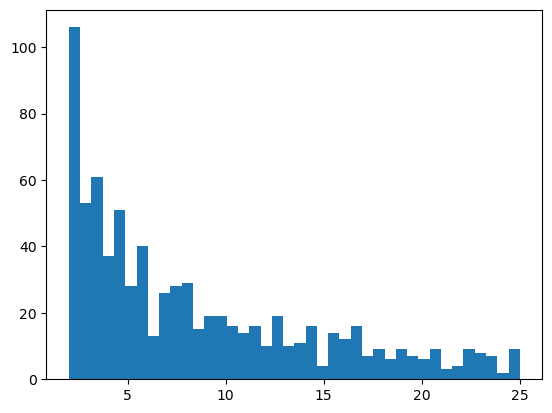

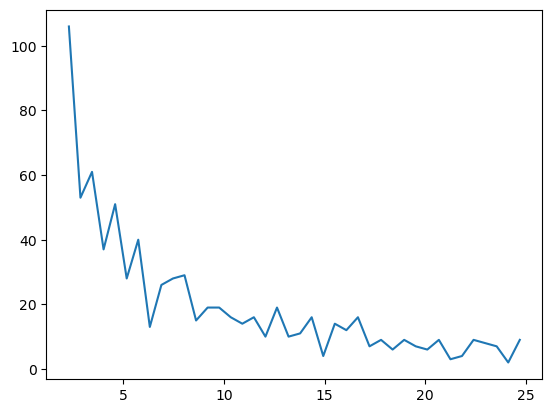

<Figure size 640x480 with 0 Axes>

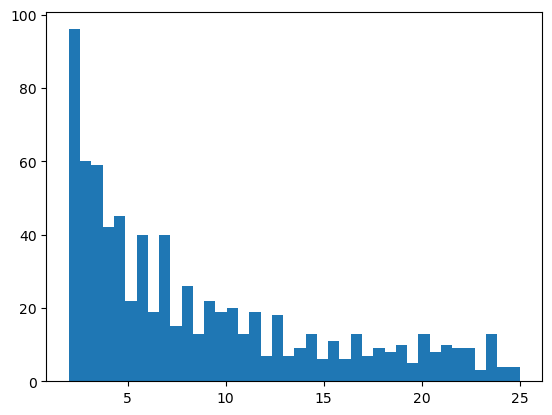

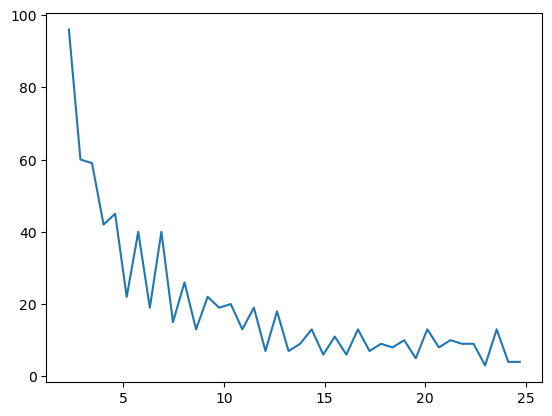

<Figure size 640x480 with 0 Axes>

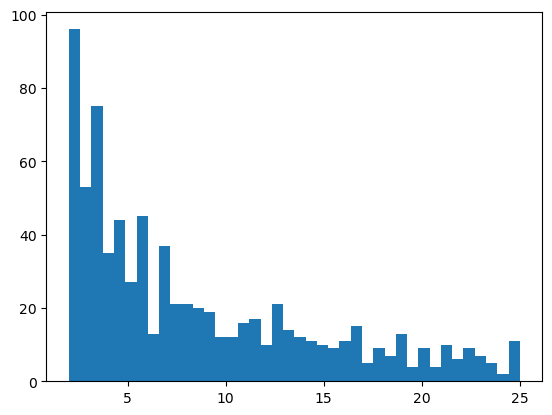

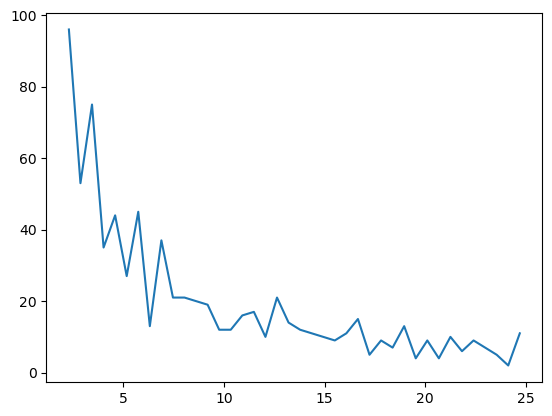

<Figure size 640x480 with 0 Axes>

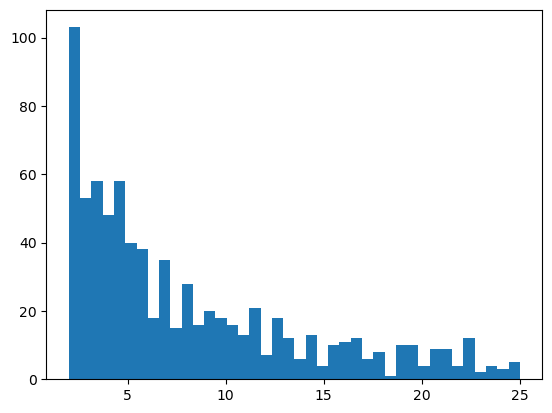

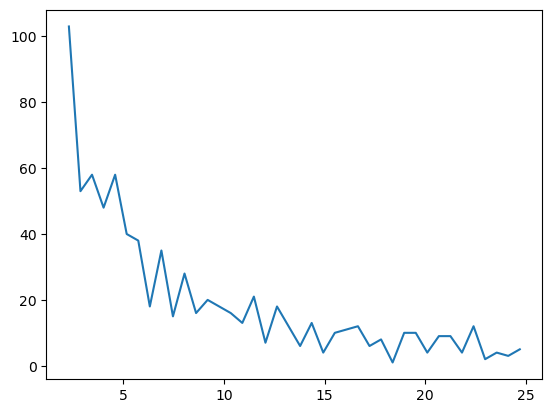

<Figure size 640x480 with 0 Axes>

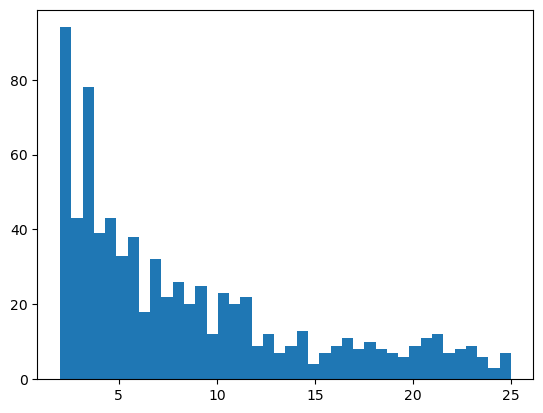

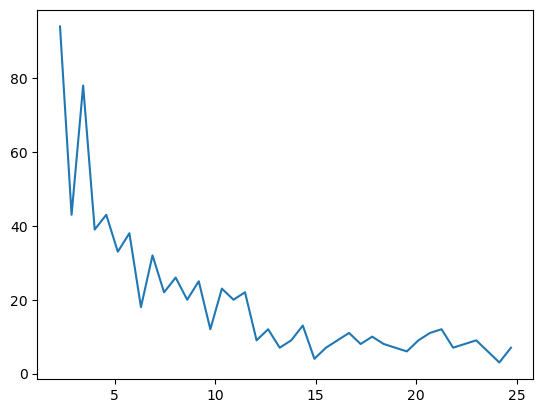

<Figure size 640x480 with 0 Axes>

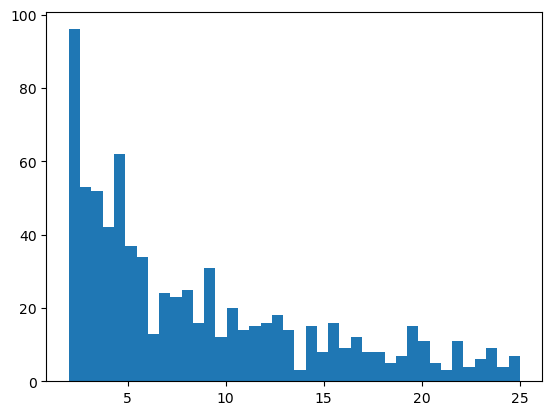

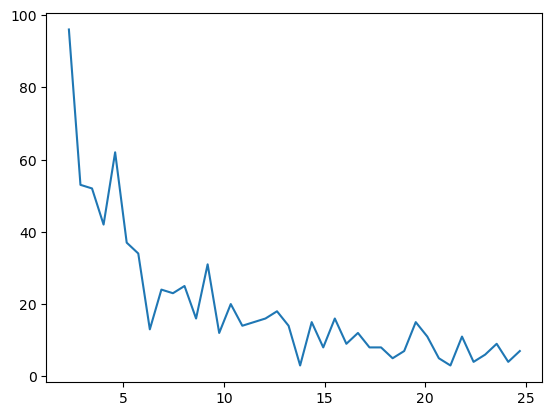

In [82]:
hist_d = []
for i in dfs_datam:
    plt.figure()
    j = buildhist(dfs_datam[i],40)
    hist_d.append(j)

In [89]:
def minmaxy(y):
    #print(np.amin(occ))
    #print(np.amax(occ))
    m = (y - min(y)) / (max(y) - min(y))
    #print(kl)
    plt.plot(m)
    return m

In [120]:
x = np.array(hist_s[2][0])

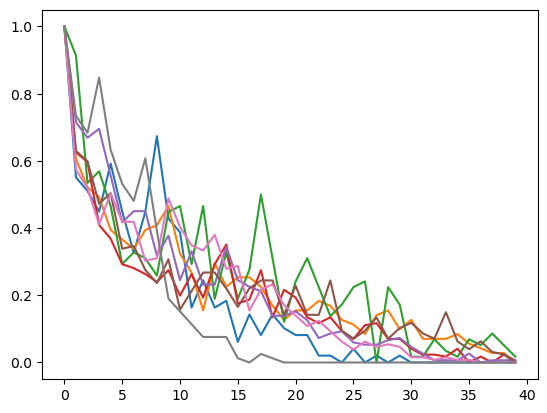

In [96]:
y_s = []
for i in range(len(hist_s)):
    hist_s[i][1] = minmaxy(hist_s[i][1])
    y_s.append(np.array(hist_s[i][1]))


In [105]:
np.zeros(shape=40)

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0.])

In [106]:
y_s

[array([1.        , 0.55102041, 0.51020408, 0.44897959, 0.59183673,
        0.44897959, 0.32653061, 0.44897959, 0.67346939, 0.42857143,
        0.3877551 , 0.16326531, 0.24489796, 0.16326531, 0.18367347,
        0.06122449, 0.14285714, 0.08163265, 0.14285714, 0.10204082,
        0.08163265, 0.08163265, 0.02040816, 0.02040816, 0.        ,
        0.04081633, 0.        , 0.02040816, 0.        , 0.02040816,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ]),
 array([1.        , 0.6056338 , 0.52112676, 0.49295775, 0.3943662 ,
        0.36619718, 0.33802817, 0.3943662 , 0.4084507 , 0.46478873,
        0.32394366, 0.26760563, 0.15492958, 0.29577465, 0.22535211,
        0.25352113, 0.25352113, 0.22535211, 0.16901408, 0.12676056,
        0.15492958, 0.15492958, 0.18309859, 0.16901408, 0.12676056,
        0.11267606, 0.08450704, 0.14084507, 0.15492958, 0.09859155,
        0.12676056, 0.07042254, 0.07042254, 0.

yy = np.zeros(shape=40)
for m in y_s:
    yy = yy + m
yy = yy / len(y_s)
plt.plot(yy)

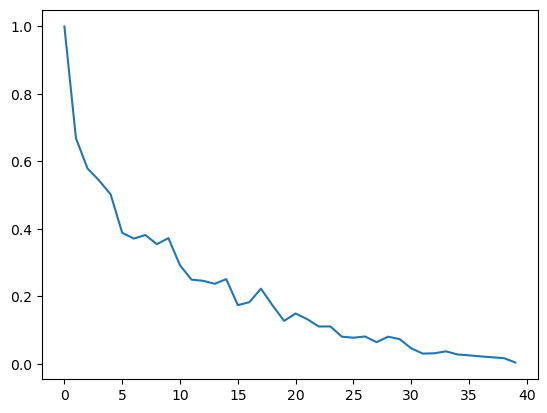

In [107]:
yy = np.zeros(shape=40)
for m in y_s:
    yy = yy + m
yy = yy / len(y_s)
plt.plot(yy)

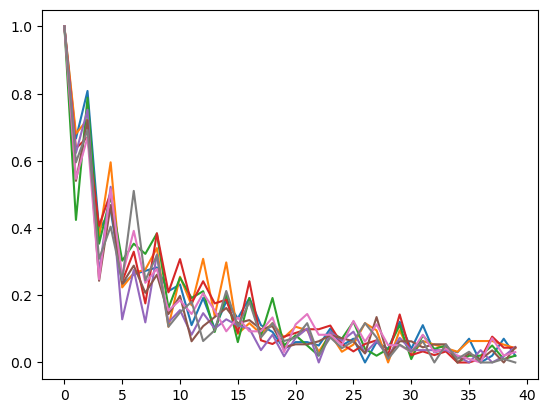

In [109]:
y_f = []
for i in range(len(hist_f)):
    hist_f[i][1] = minmaxy(hist_f[i][1])
    y_f.append(np.array(hist_f[i][1]))


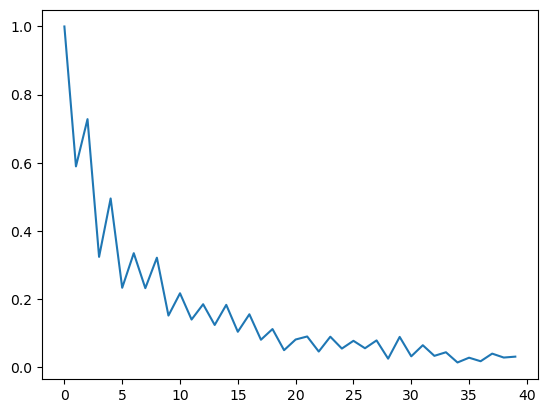

In [110]:
yy_f = np.zeros(shape=40)
for m in y_f:
    yy_f = yy_f + m
yy_f = yy_f / len(y_f)
plt.plot(yy_f)

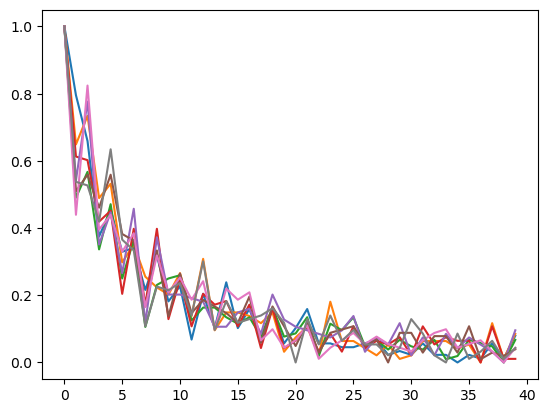

In [111]:
y_d = []
for i in range(len(hist_d)):
    hist_d[i][1] = minmaxy(hist_d[i][1])
    y_d.append(np.array(hist_d[i][1]))


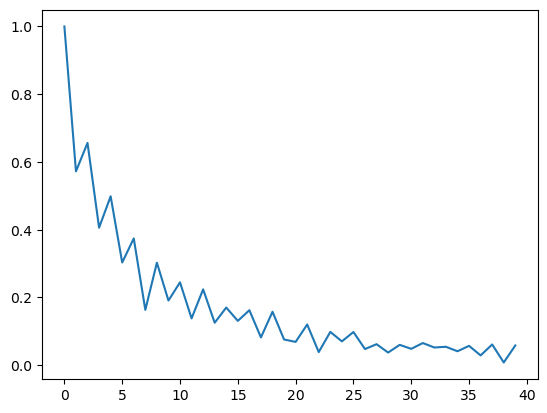

In [112]:
yy_d = np.zeros(shape=40)
for m in y_d:
    yy_d = yy_d + m
yy_d = yy_d / len(y_d)
plt.plot(yy_d)

In [119]:
x

array([1.        , 0.9137931 , 0.53448276, 0.56896552, 0.46551724,
       0.29310345, 0.32758621, 0.31034483, 0.25862069, 0.44827586,
       0.46551724, 0.29310345, 0.46551724, 0.18965517, 0.32758621,
       0.18965517, 0.27586207, 0.5       , 0.31034483, 0.12068966,
       0.24137931, 0.31034483, 0.22413793, 0.13793103, 0.17241379,
       0.22413793, 0.24137931, 0.        , 0.22413793, 0.17241379,
       0.01724138, 0.01724138, 0.06896552, 0.03448276, 0.01724138,
       0.06896552, 0.05172414, 0.0862069 , 0.05172414, 0.01724138])

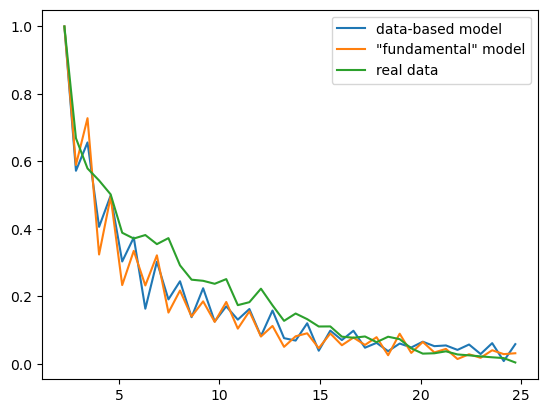

In [126]:
plt.plot(x, yy_d, label='data-based model')
plt.plot(x, yy_f, label='"fundamental" model')
plt.plot(x, yy, label='real data')
plt.legend()

In [124]:
stats.kstest(yy_f, yy)

KstestResult(statistic=0.2, pvalue=0.404587405685253)

In [127]:
stats.kstest(yy_d, yy)

KstestResult(statistic=0.2, pvalue=0.404587405685253)

## углы

In [158]:
def buildhistAng(df,n):
    #sampRate = len(df) / (df.iloc[-1]['time'] - df.iloc[0]['time'])
    #step = round(sampRate * n)
    #chose which samples will remain
    #k = []
    #if step == 0:
     #   step = 1
    #for i in range(len(df)):
     #   if i % step == 0:
      #      k.append(i)
    #df = df.iloc[k]
    
    #xy = []
    #x0 = df['x'][0]
    #y0 = df['y'][0]
    #delX = []
    #delY = []
    #for i in range(len(df)):
        #dx = df.iloc[i]['x'] - x0
        #dy = df.iloc[i]['y'] - y0
        #xxy = pow(pow(dx, 2) + pow(dy, 2), 0.5)
        #delX.append(dx)
        #delY.append(dy)
        #xy.append(xxy)
        #x0 = df.iloc[i]['x']
        #y0 = df.iloc[i]['y']

    #if 'xy' not in df:
        #df.insert(3, "xy", xy)

    xynuma = df['angles'].to_numpy()
    #histogram
    plt.figure()
    y, binEdges, _ = plt.hist(xynuma, bins=n, range=(-90, 270))
    #y, binEdges, _ = plt.hist(xynuma, bins=n, range=(2, 25))
    x = 0.5 * (binEdges[1:] + binEdges[:-1])
    plt.show()
    plt.figure()
    plt.plot(x, y)
    plt.show()
    #fourie
    #DURATION = (df.iloc[-1]['time'] - df.iloc[0]['time'])
    #SAMPLE_RATE = len(df) / DURATION
    #N = SAMPLE_RATE * DURATION
    #yf = rfft(xynum)
    #xf = rfftfreq(int(N), int(1 / SAMPLE_RATE))
    #plt.figure()
    #plt.plot(xf, np.abs(yf))
    #plt.show()
    return [x, y]

In [159]:

#мы добавляем фильтр скорость и НЕФИЛЬТРОВАННЫЕ углы
def addFilteredV(df):
    vx = []
    vy = []
    v = []
    ang = []
    boo = True
    for i in range(len(df)):
        if i == 0:
            vx.append(0)
            vy.append(0)
            v.append(0)
        else:
            dx = df['x'][i]-df['x'][i-1]
            dy = df['y'][i]-df['y'][i-1]
            dt = df['time'][i]-df['time'][i-1]
            vvx = dx/dt
            vvy = dy/dt
            vv = pow(pow(vvx, 2) + pow(vvy, 2), 0.5)
            vx.append(vvx)
            vy.append(vvy)
            v.append(vv)
            # угол
            #хз что делать с 0
            x = vvy/vvx
            if vvx >= 0:
                res = math.degrees(math.atan(x))
            else:
                res = 180 + math.degrees(math.atan(x))
            #убираем перевод в наглядную окружность. пусть остается тригонометрическая
            #if res <= 0:
                #res = -res + 90
                #вообще можно было бы записать и это как 360 - res + 90, т к лишние 360 и так вычитаются через пару строчек
            #elif res > 0:
                #res = 360 - res + 90
            if res >= 360:
                res -= 360
            ang.append(res)
            if boo:
                ang.append(res)
                boo = False
    df.insert(3, "Vx", vx)
    df.insert(4, "Vy", vy)
    df.insert(5, "V", v)
    df.insert(6, "angles", ang)
    #df['V'] = pd.Series(gaussian_filter1d(df['V'], 5))
    #df['Vx'] = pd.Series(gaussian_filter1d(df['Vx'], 5))
    #df['Vy'] = pd.Series(gaussian_filter1d(df['Vy'], 5))
    return(df)

In [152]:
for i in dfs_fund:
    dfs_fund[i] = addFilteredV(dfs_fund[i])

ValueError: cannot insert Vx, already exists

In [138]:
for i in dfs_datam:
    dfs_datam[i] = addFilteredV(dfs_datam[i])

<Figure size 640x480 with 0 Axes>

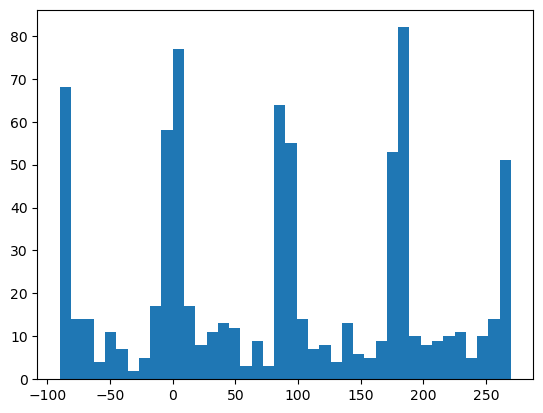

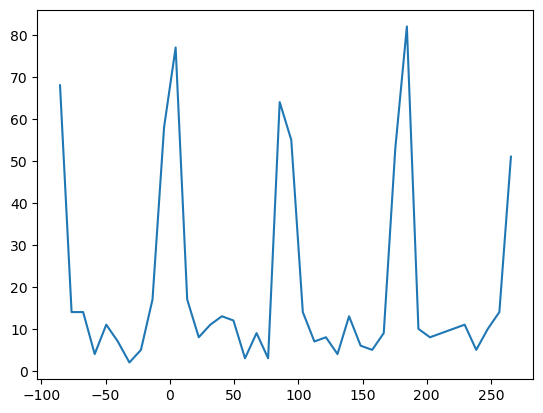

<Figure size 640x480 with 0 Axes>

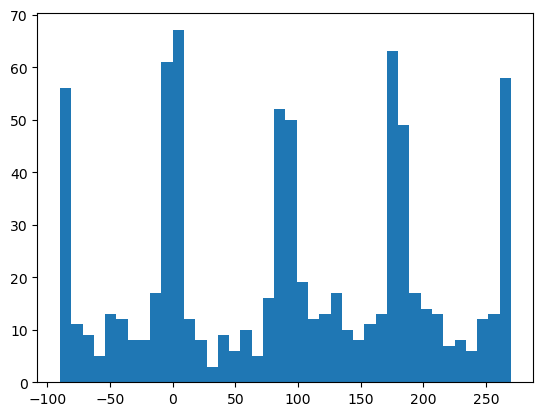

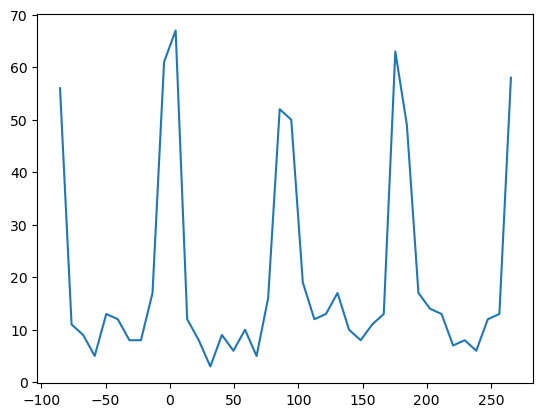

<Figure size 640x480 with 0 Axes>

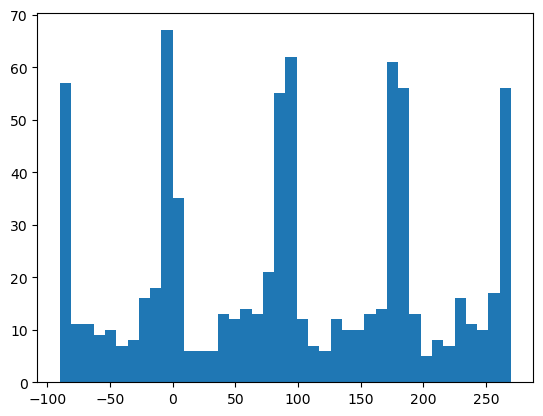

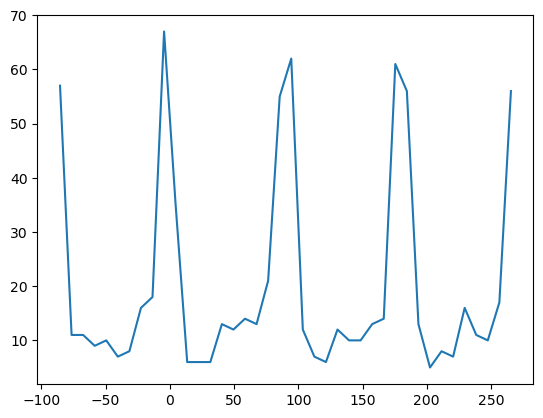

<Figure size 640x480 with 0 Axes>

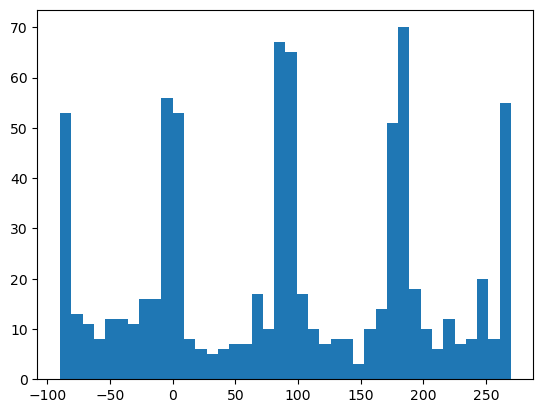

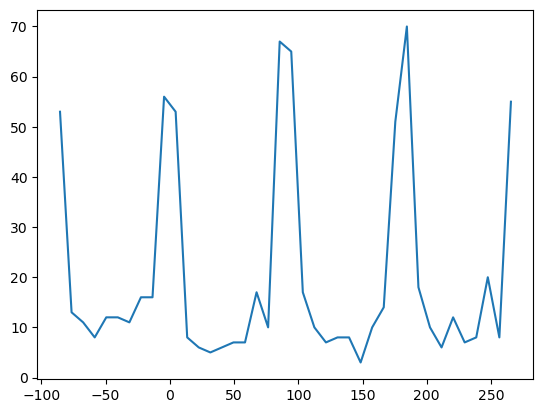

<Figure size 640x480 with 0 Axes>

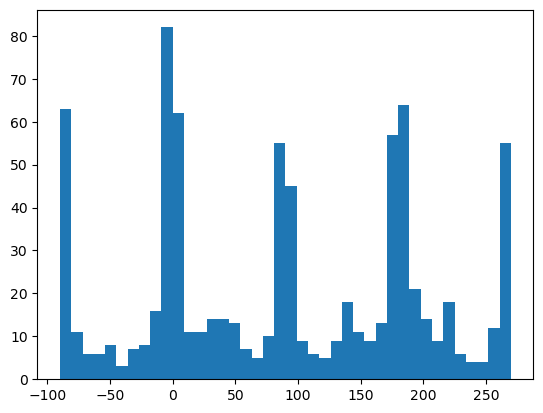

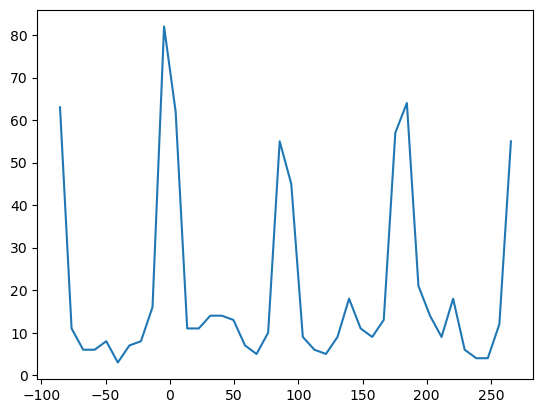

<Figure size 640x480 with 0 Axes>

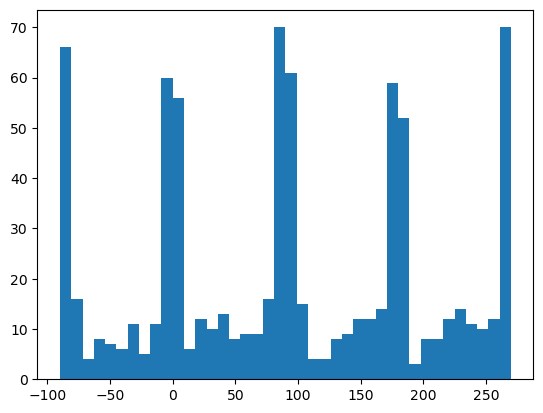

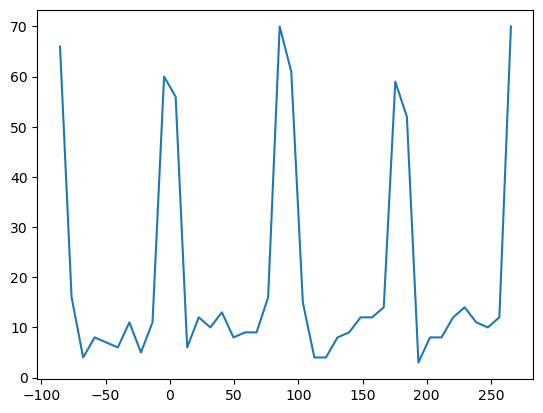

<Figure size 640x480 with 0 Axes>

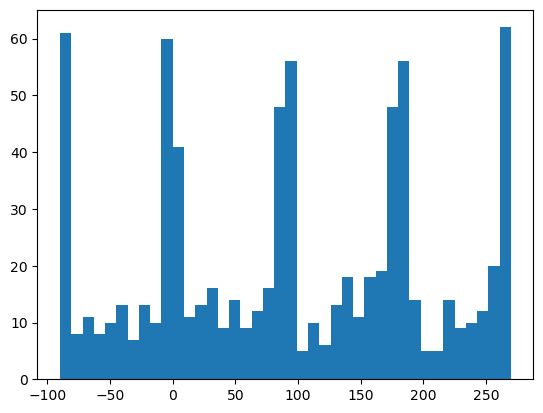

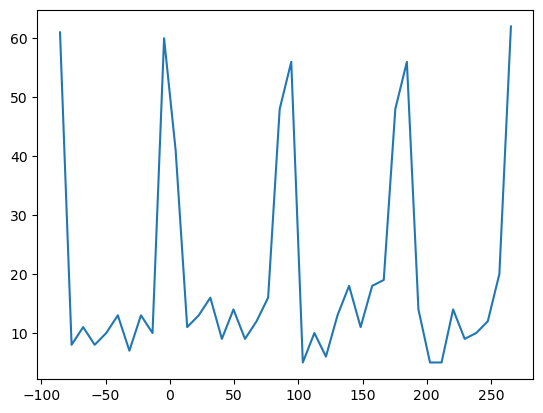

<Figure size 640x480 with 0 Axes>

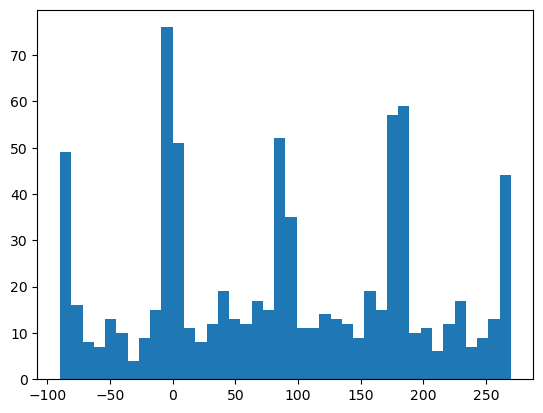

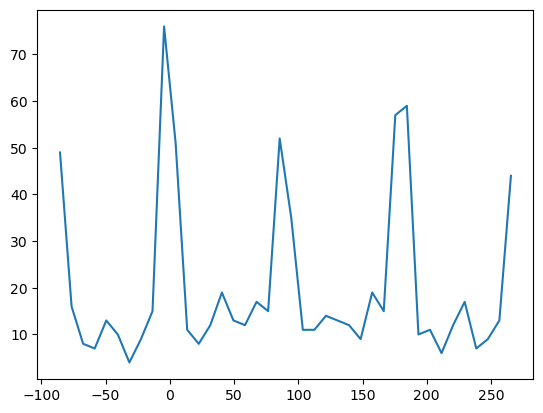

In [160]:
hist_f = []
for i in dfs_fund:
    plt.figure()
    j = buildhistAng(dfs_fund[i],40)
    hist_f.append(j)

<Figure size 640x480 with 0 Axes>

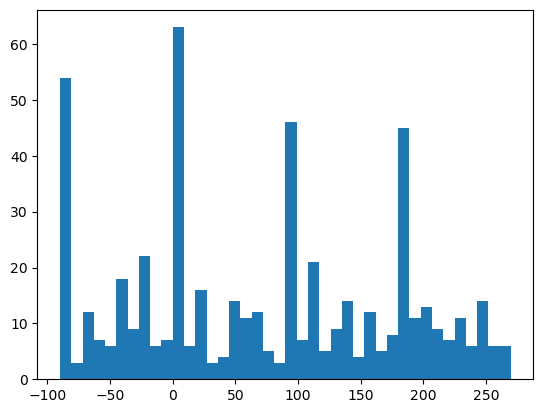

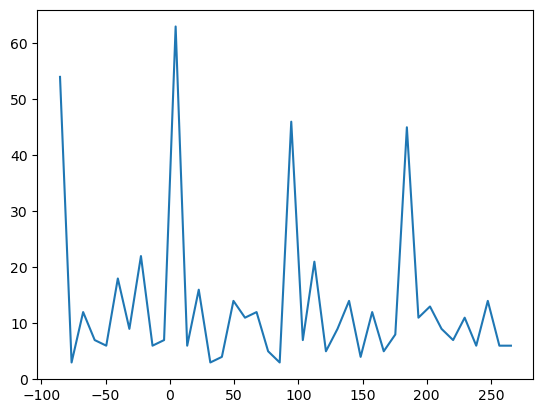

<Figure size 640x480 with 0 Axes>

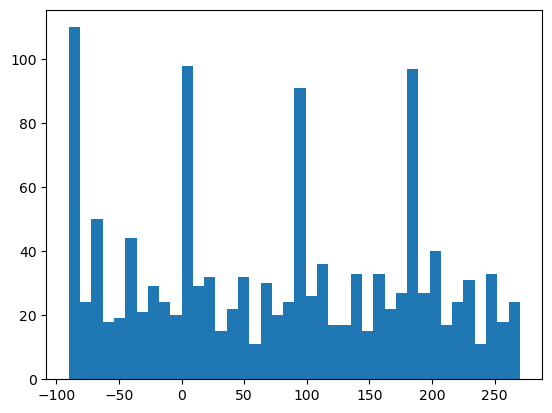

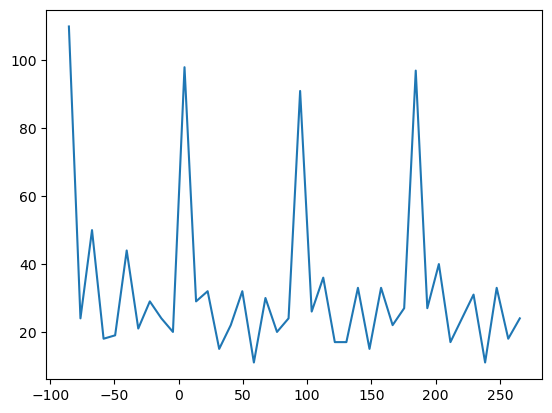

<Figure size 640x480 with 0 Axes>

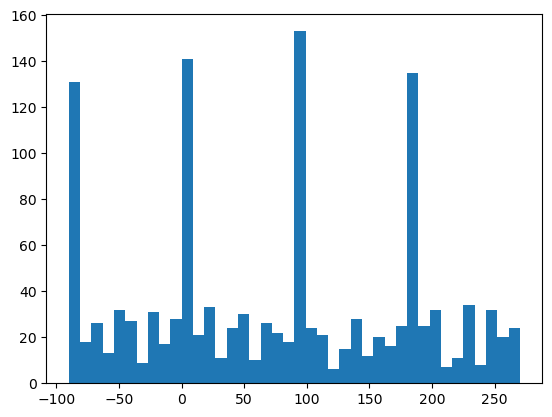

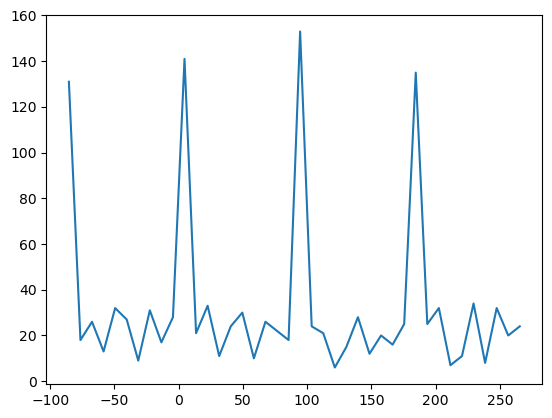

<Figure size 640x480 with 0 Axes>

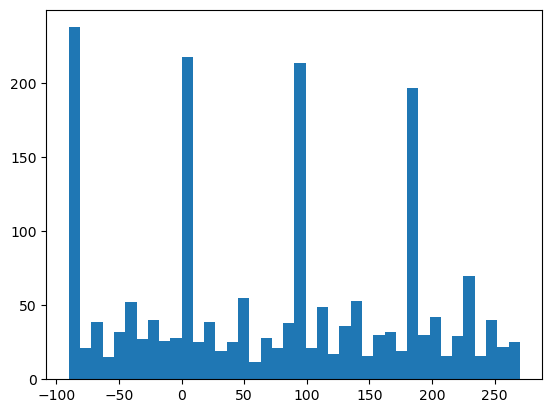

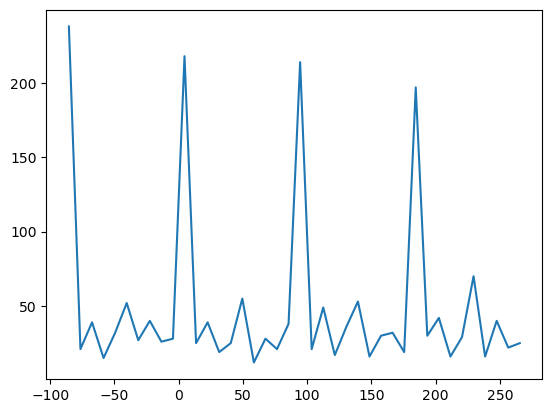

<Figure size 640x480 with 0 Axes>

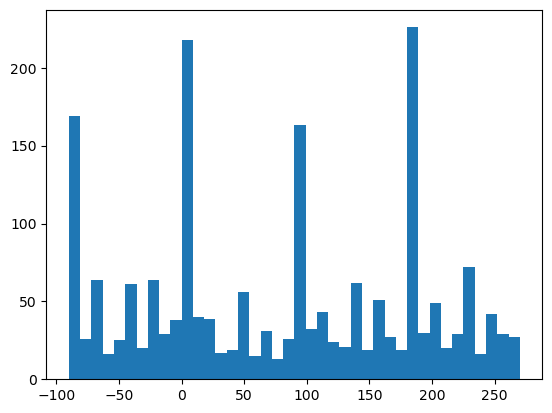

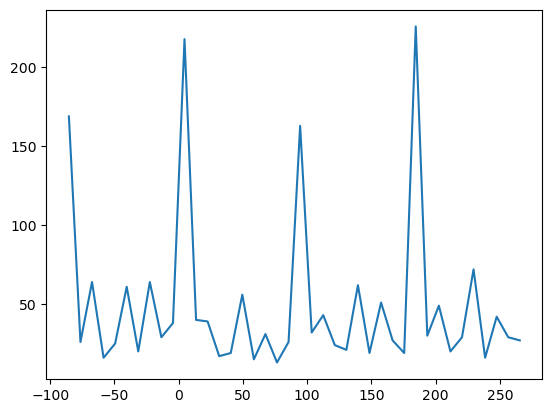

<Figure size 640x480 with 0 Axes>

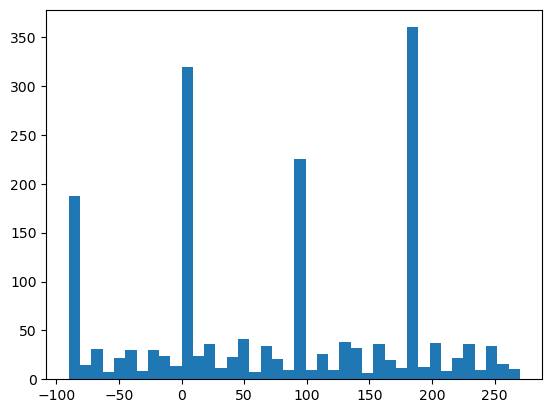

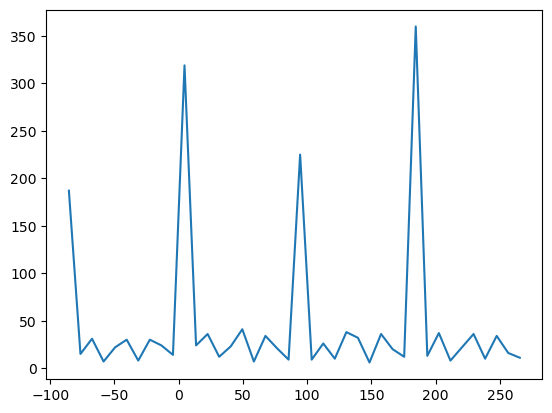

<Figure size 640x480 with 0 Axes>

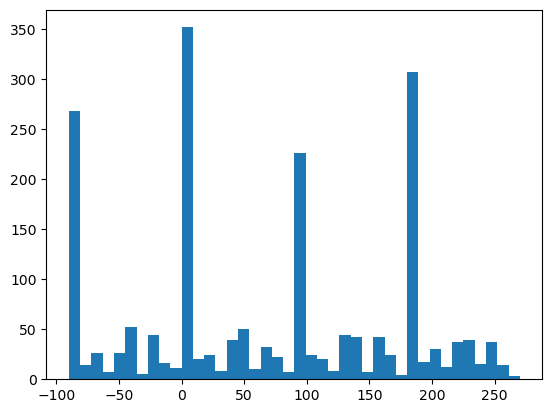

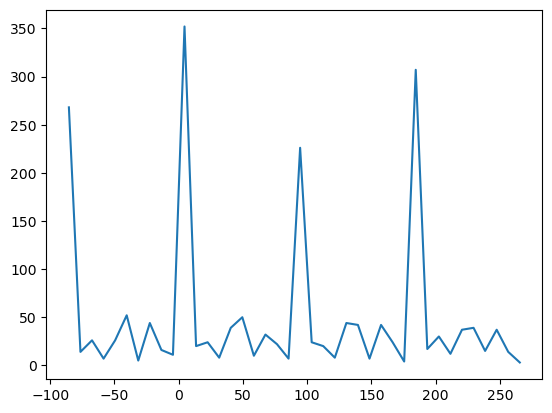

<Figure size 640x480 with 0 Axes>

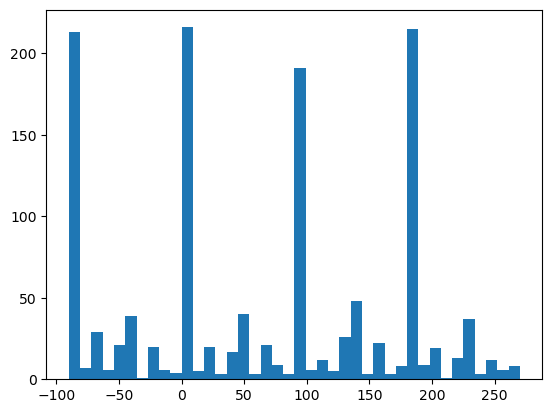

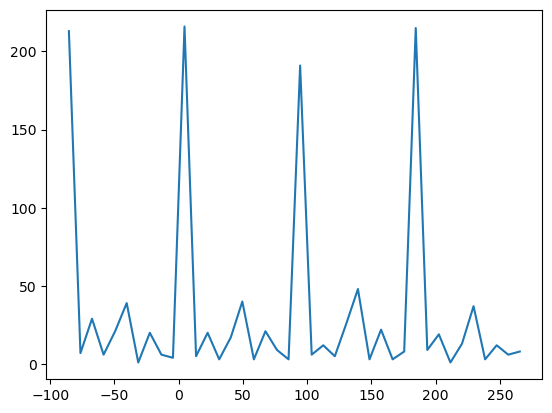

In [161]:
hist_s = []
for i in dfs_step:
    plt.figure()
    j = buildhistAng(dfs_step[i],40)
    hist_s.append(j)

<Figure size 640x480 with 0 Axes>

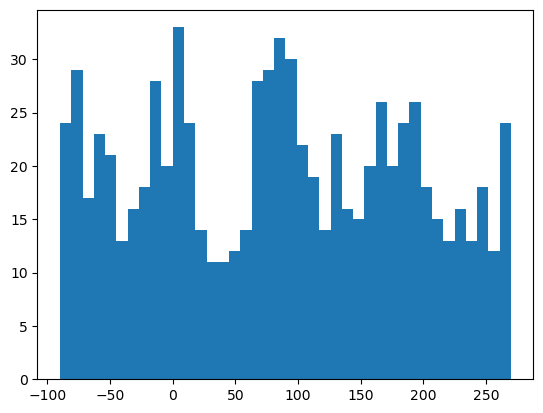

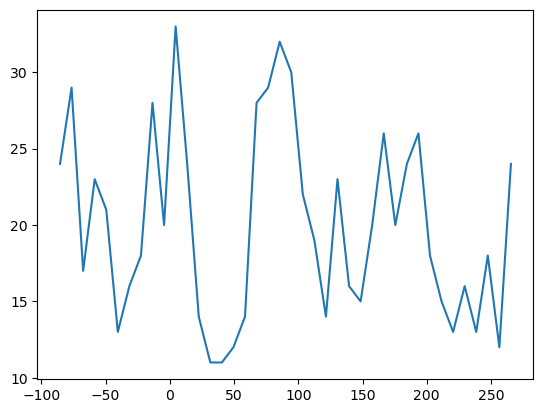

<Figure size 640x480 with 0 Axes>

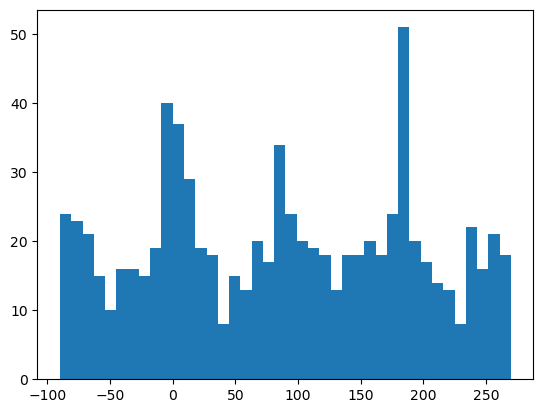

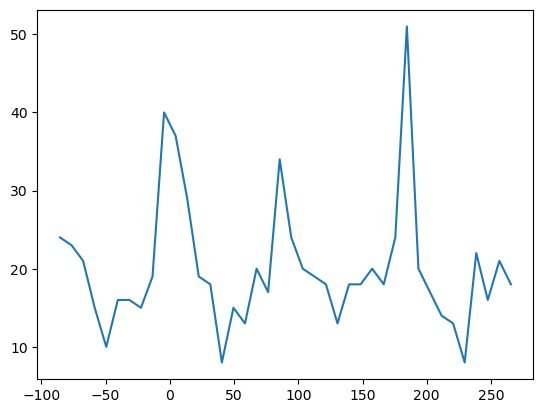

<Figure size 640x480 with 0 Axes>

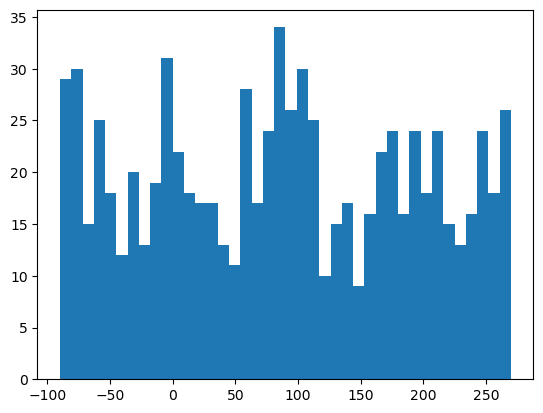

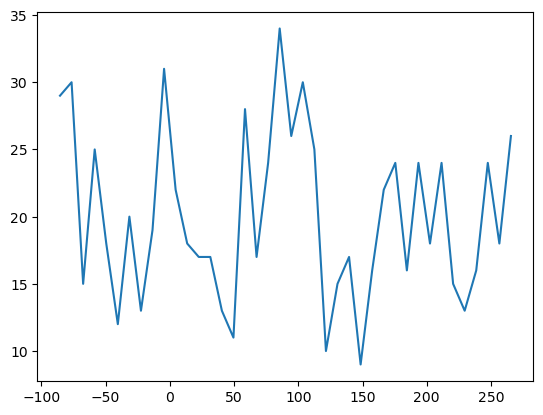

<Figure size 640x480 with 0 Axes>

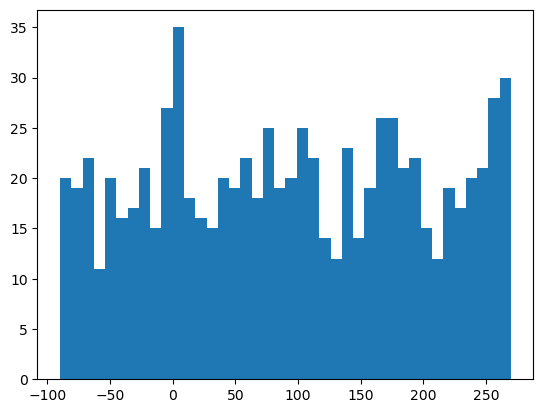

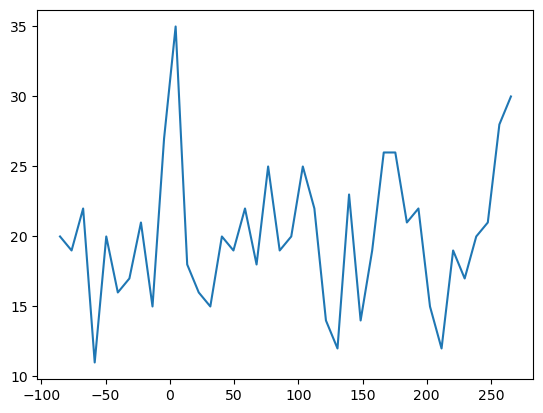

<Figure size 640x480 with 0 Axes>

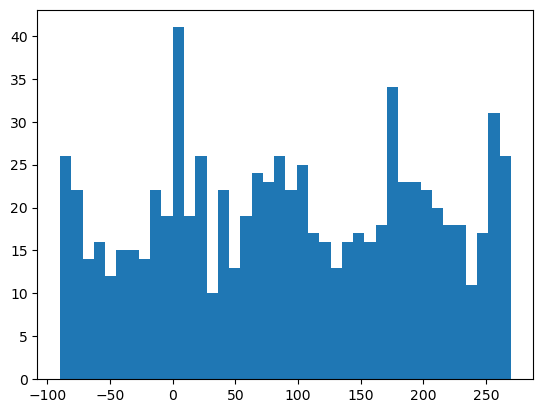

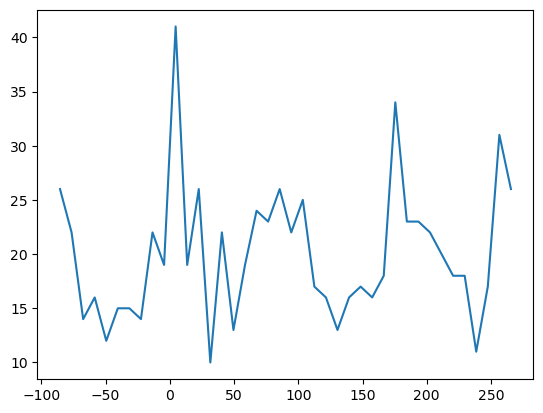

<Figure size 640x480 with 0 Axes>

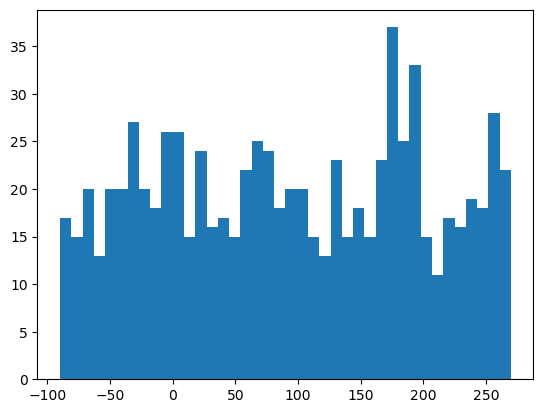

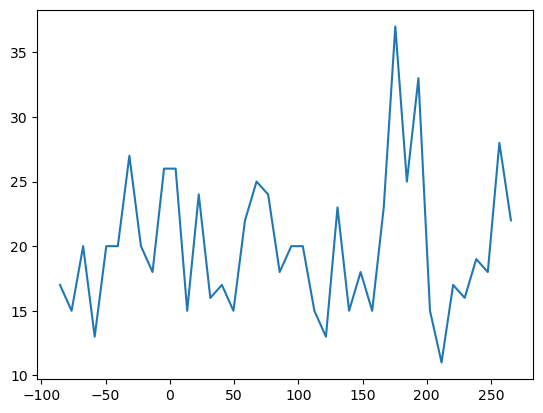

<Figure size 640x480 with 0 Axes>

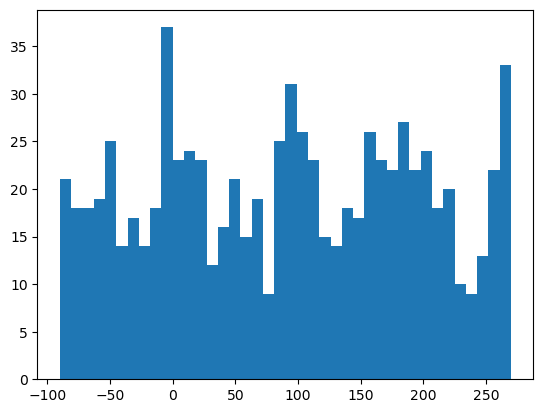

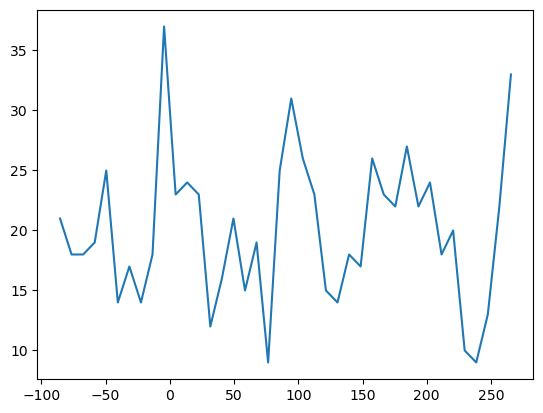

<Figure size 640x480 with 0 Axes>

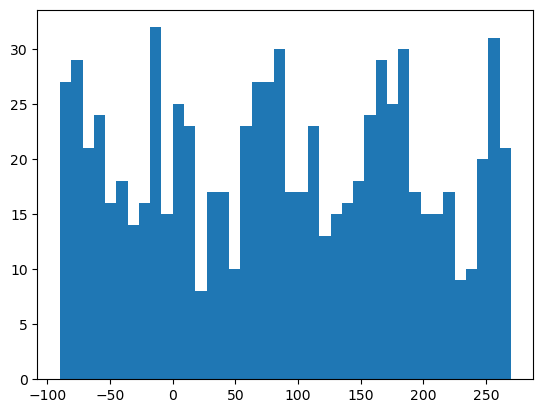

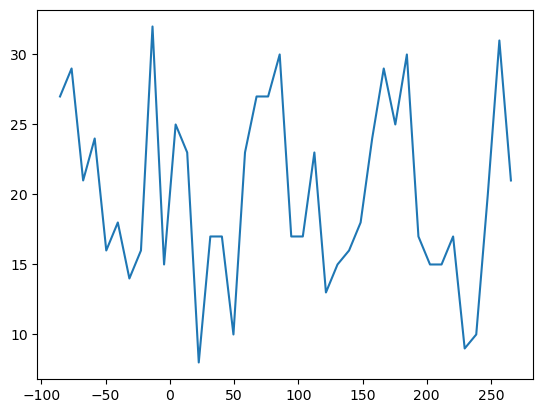

In [162]:
hist_d = []
for i in dfs_datam:
    plt.figure()
    j = buildhistAng(dfs_datam[i],40)
    hist_d.append(j)

In [163]:
x = np.array(hist_s[2][0])

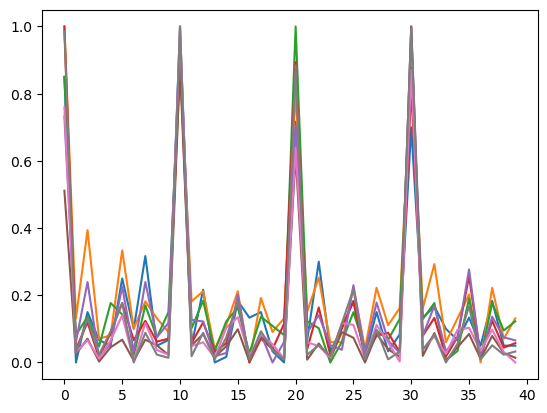

In [164]:
y_s = []
for i in range(len(hist_s)):
    hist_s[i][1] = minmaxy(hist_s[i][1])
    y_s.append(np.array(hist_s[i][1]))


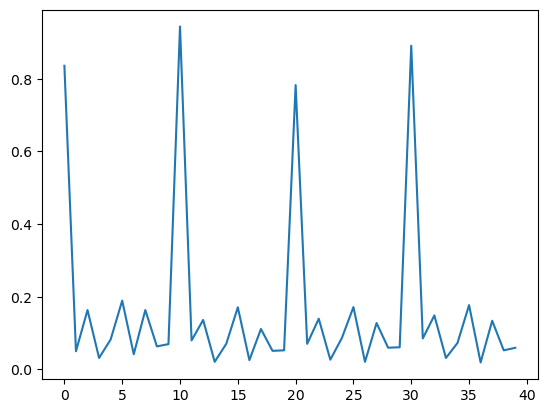

In [167]:
yy = np.zeros(shape=40)
for m in y_s:
    yy = yy + m
yy = yy / len(y_s)
plt.plot(yy)

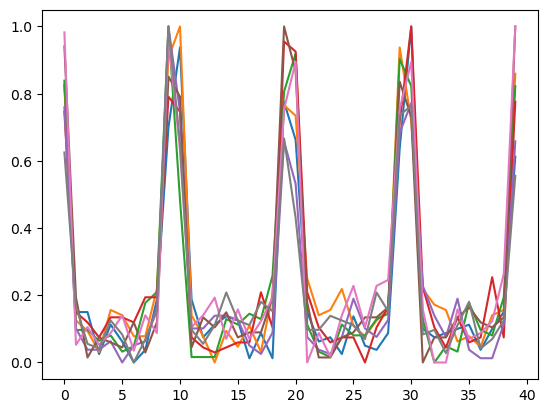

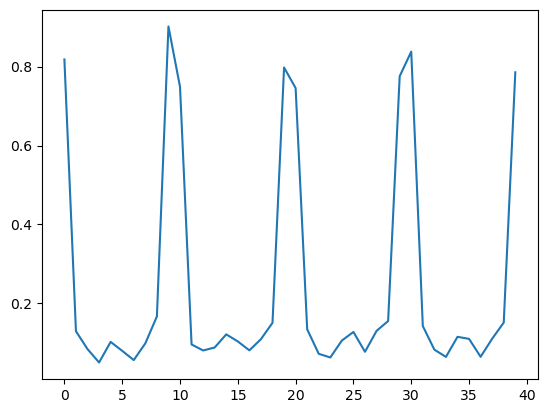

In [170]:
y_f = []
for i in range(len(hist_f)):
    hist_f[i][1] = minmaxy(hist_f[i][1])
    y_f.append(np.array(hist_f[i][1]))


yy_f = np.zeros(shape=40)
for m in y_f:
    yy_f = yy_f + m
yy_f = yy_f / len(y_f)
plt.figure()
plt.plot(yy_f)

In [178]:
len(hist_f)

8

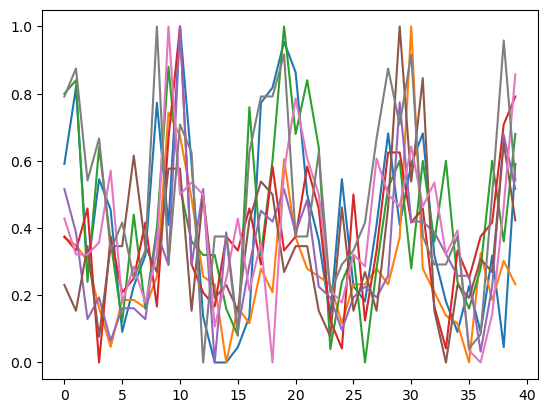

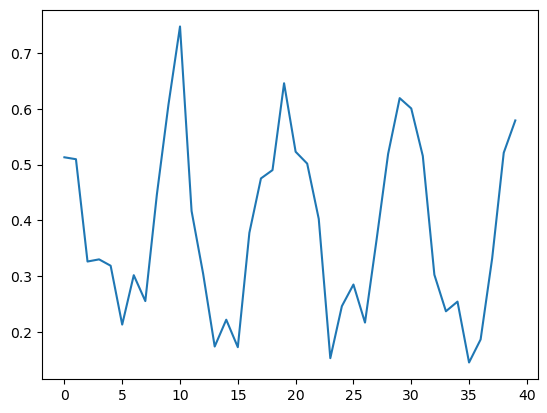

In [171]:
y_d = []
for i in range(len(hist_d)):
    hist_d[i][1] = minmaxy(hist_d[i][1])
    y_d.append(np.array(hist_d[i][1]))


yy_d = np.zeros(shape=40)
for m in y_d:
    yy_d = yy_d + m
yy_d = yy_d / len(y_d)
plt.figure()
plt.plot(yy_d)

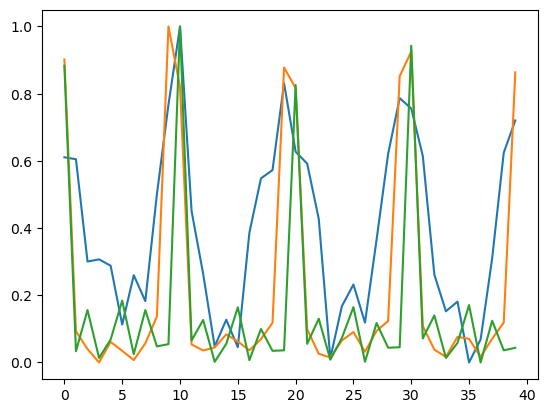

In [175]:
yy_d =minmaxy(yy_d)
yy_f =minmaxy(yy_f)
yy =minmaxy(yy)


KstestResult(statistic=0.125, pvalue=0.9188052214121167)
KstestResult(statistic=0.625, pvalue=1.2344976480973208e-07)


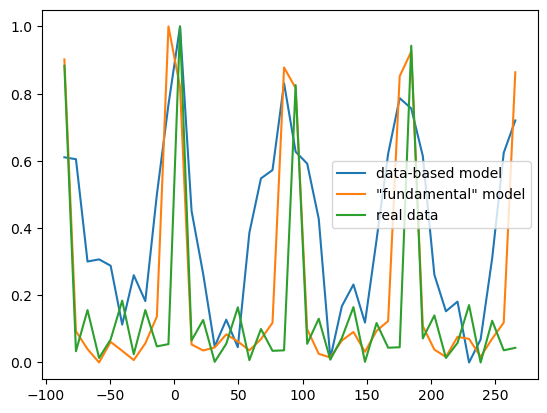

In [176]:
plt.plot(x, yy_d, label='data-based model')
plt.plot(x, yy_f, label='"fundamental" model')
plt.plot(x, yy, label='real data')
plt.legend()

print(stats.kstest(yy_f, yy))

print(stats.kstest(yy_d, yy))